In [24]:
import os
import numpy as np
import cv2
import torch

from drot.tune import KLTripletOptimizer
from drot.ot import *
from drot.plot import *

In [14]:
RAW_DISP = "disp.bin"
POST_DISP = "disp_postprocess.bin"
SAM_V2_VITL = "dam_v2_vitl_out.npy"
SAM_V2_VITB = "dam_v2_vitb_out.npy"
SAM_V2_VITS = "dam_v2_vits_out.npy"
LEFT_GRAY = "left.bmp"

In [2]:
def load_bin(path, h, w):
    return np.fromfile(path, dtype=np.uint16, count=h*w).reshape((h, w))

In [25]:
class Experiment:
    def __init__(self, base_dir, n_epochs, w_kl, w_hu):
        self.n_epoches = n_epochs
        self.w_kl = w_kl
        self.w_hu = w_hu

        folder = base_dir.split("/")[-1]
        print(f"processing {folder} now ...")
        left_gray_path = os.path.join(base_dir, LEFT_GRAY)
        left_gray = cv2.imread(left_gray_path, cv2.IMREAD_GRAYSCALE)
        print("The original input image is: ")
        cm_left = apply_colormap(left_gray)
        figure_show(cm_left)
        h, w = left_gray.shape
        raw_disp = load_bin(os.path.join(base_dir, RAW_DISP), h, w) / 64
        post_disp = load_bin(os.path.join(base_dir, POST_DISP), h, w) / 64
        vitl_disp = np.load(os.path.join(base_dir, SAM_V2_VITL))
        vitb_disp = np.load(os.path.join(base_dir, SAM_V2_VITB))
        vits_disp = np.load(os.path.join(base_dir, SAM_V2_VITS))

        self.agg_map = {
            "raw":raw_disp,
            "post":post_disp,
        }

        self.dl_map = {
            "s":vits_disp,
            "b":vitb_disp,
            "l":vitl_disp,
        }

    def pipeline(self):
        for d in self.agg_map.keys():
            print(f"Showing {d} disp colormap ...")
            figure_show(self.agg_map[d])
            for v in self.dl_map.keys():
                print(f"We are processing {d} disp for target and vit_{v} for reference...")
                print(f"Showing vit_{v} reference colormap ...")
                figure_show(self.dl_map[v])
                
                insufficient_indices = np.where(self.agg_map[d] == 0)
                dl = np.copy(self.dl_map[v])
                dl[insufficient_indices] = 0

                norm_d, minv_d, maxv_d = minmax_normalizer(self.agg_map[d])   # for agg
                norm_v, minv_v, maxv_v = minmax_normalizer(dl)    # for dl
                optimal_t = ot_transport_emd(norm_d, norm_v)
                optimal_t_r = restore_from_minmax(optimal_t, minv_d, maxv_d)

                xs = torch.tensor(optimal_t_r, dtype=torch.float32).unsqueeze(0).clone().detach().requires_grad_(True)
                xt = torch.tensor(self.agg_map[d], dtype=torch.float32).unsqueeze(0)
                xd = torch.tensor(dl, dtype=torch.float32).unsqueeze(0)

                kl_optim = KLTripletOptimizer(xs, xt, xd)
                kl_optim.weights_adjust(self.w_kl, self.w_hu)
                kl_optim.train(self.n_epoches)

                self._plotter(kl_optim)

                o_t = kl_optim.xs.cpu().squeeze(0).detach().numpy()
                o_t[o_t < 1] = 0
                print(f"Final refined optimal disp colormap ...")
                figure_show(o_t)

                print(f"The mean disparity level difference is {np.mean(o_t - self.agg_map[d])}")
                print(f"Showing difference colormap ...")
                figure_show(o_t - self.agg_map[d], 0, 0, 1)

    def _plotter(self, optimizer:KLTripletOptimizer):
        plt.figure(figsize=(10, 5))
        plt.plot(optimizer.total_losses, label='Total Loss')
        plt.plot(optimizer.kl_losses, label='KL Divergence Loss')
        plt.plot(optimizer.huber_losses, label='Huber Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Loss Progression During Training')
        plt.legend()
        plt.grid(True)
        plt.show()
    

In [26]:
top_dir = "/home/william/extdisk/data/disp-refine/feynman"
n_epoches = 2000
w_kl = 200000
w_hu = 1
folders = [f for f in os.listdir(top_dir) if os.path.isdir(os.path.join(top_dir, f))]
folders

['4', '1', '2', '6', '3', '5']

processing 4 now ...
The original input image is: 


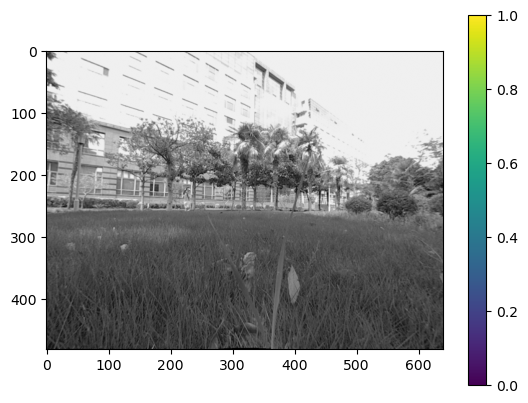

Showing raw disp colormap ...


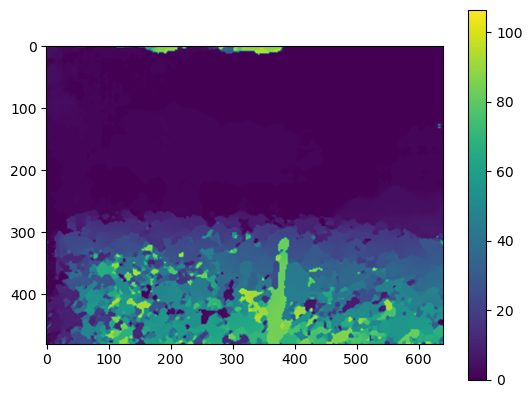

We are processing raw disp for target and vit_s for reference...
Showing vit_s reference colormap ...


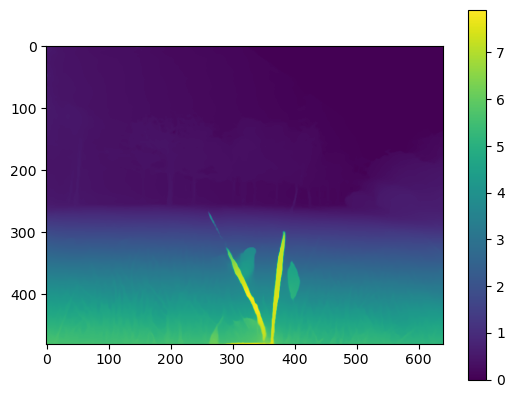

Running on: cuda


100%|██████████| 2000/2000 [00:05<00:00, 344.85it/s]


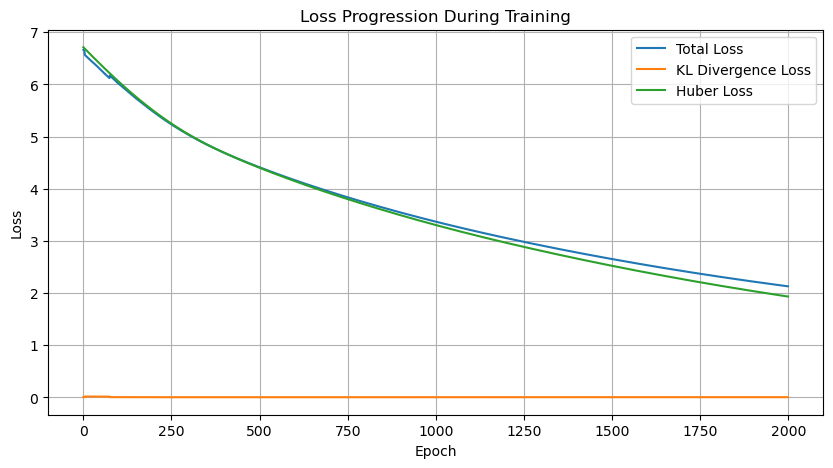

Final refined optimal disp colormap ...


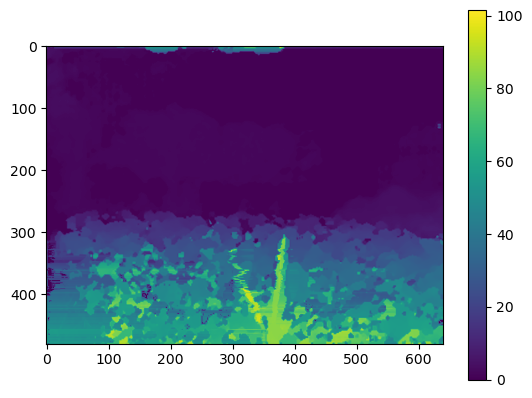

The mean disparity level difference is 1.0771450019682136
Showing difference colormap ...


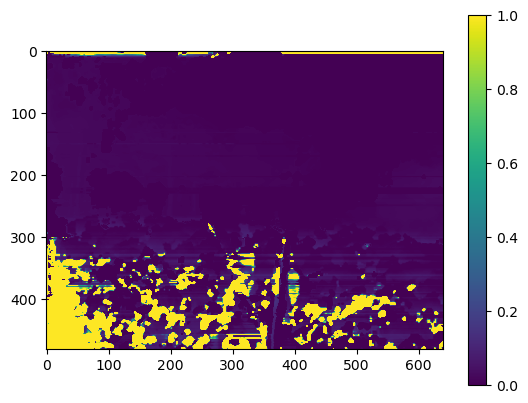

We are processing raw disp for target and vit_b for reference...
Showing vit_b reference colormap ...


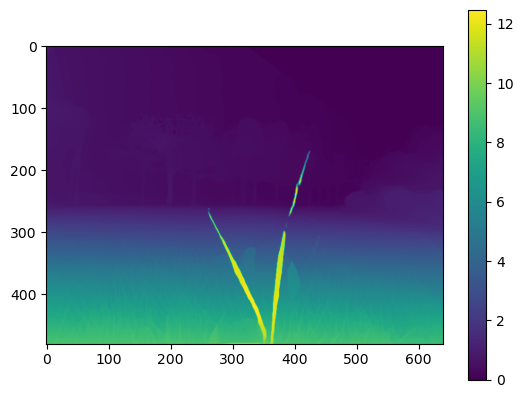

Running on: cuda


100%|██████████| 2000/2000 [00:06<00:00, 331.48it/s]


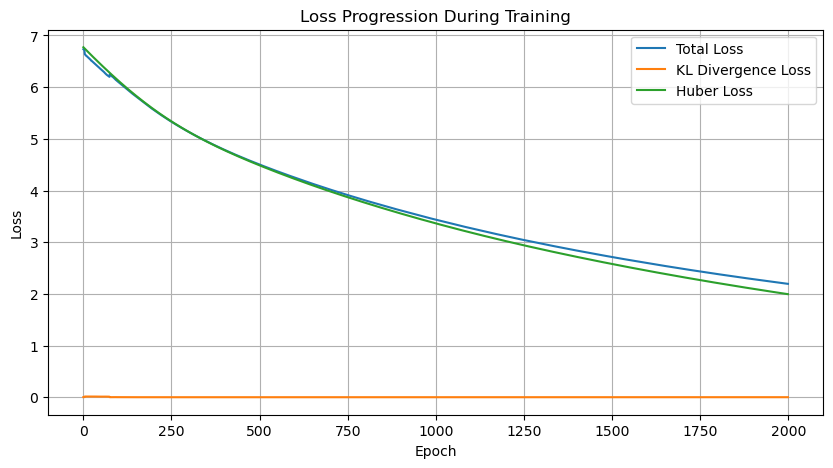

Final refined optimal disp colormap ...


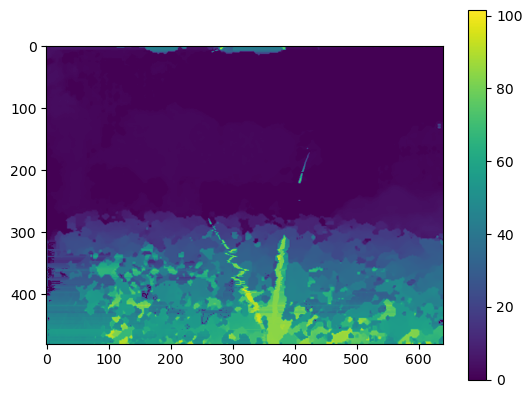

The mean disparity level difference is 1.1442427561955992
Showing difference colormap ...


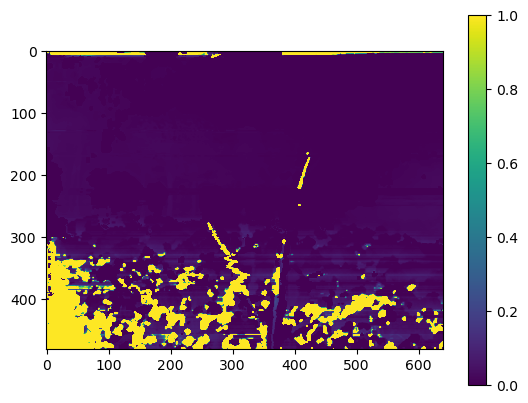

We are processing raw disp for target and vit_l for reference...
Showing vit_l reference colormap ...


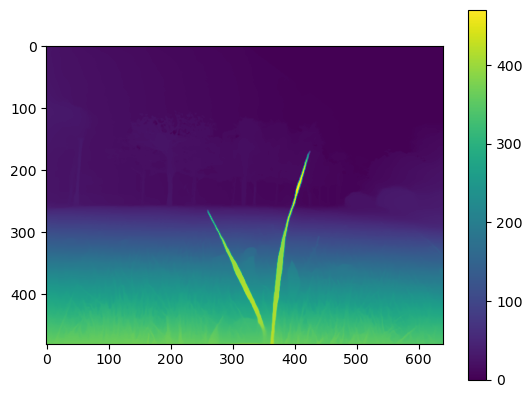

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 272.35it/s]


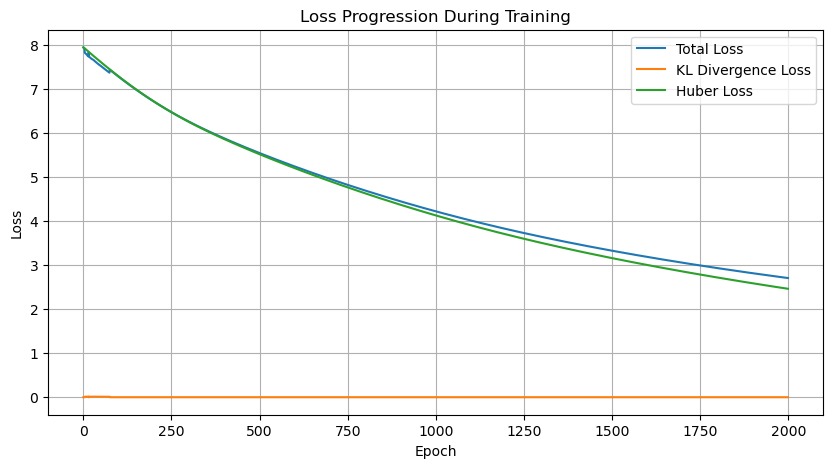

Final refined optimal disp colormap ...


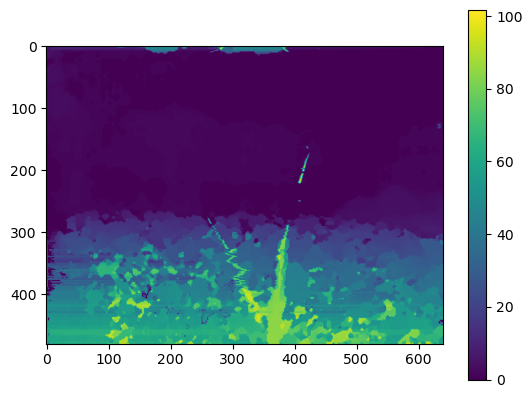

The mean disparity level difference is 1.8146131536341272
Showing difference colormap ...


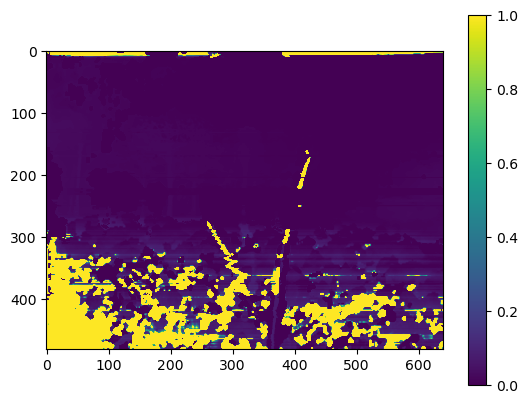

Showing post disp colormap ...


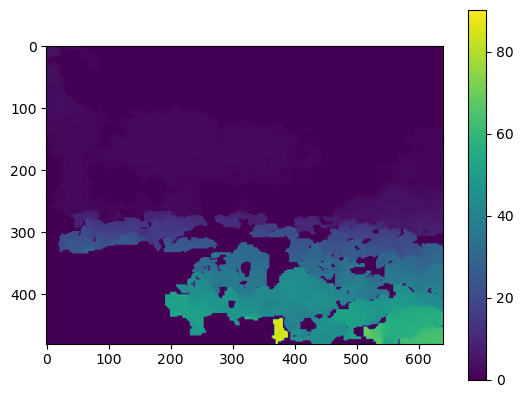

We are processing post disp for target and vit_s for reference...
Showing vit_s reference colormap ...


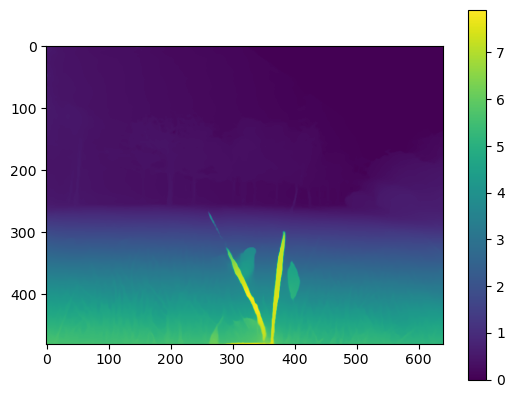

Running on: cuda


100%|██████████| 2000/2000 [00:06<00:00, 287.34it/s]


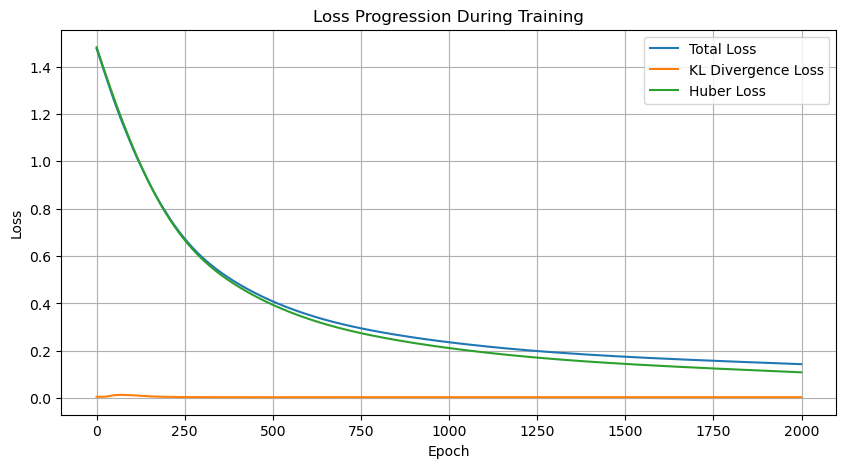

Final refined optimal disp colormap ...


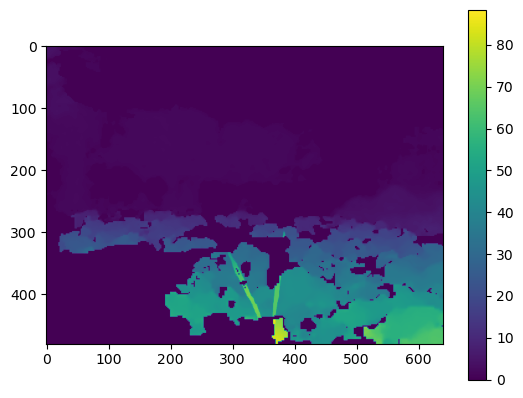

The mean disparity level difference is 0.0721364706971993
Showing difference colormap ...


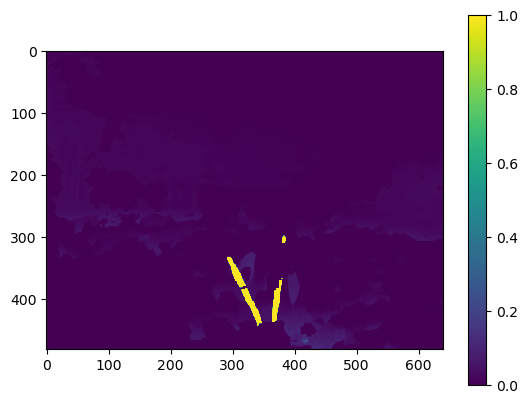

We are processing post disp for target and vit_b for reference...
Showing vit_b reference colormap ...


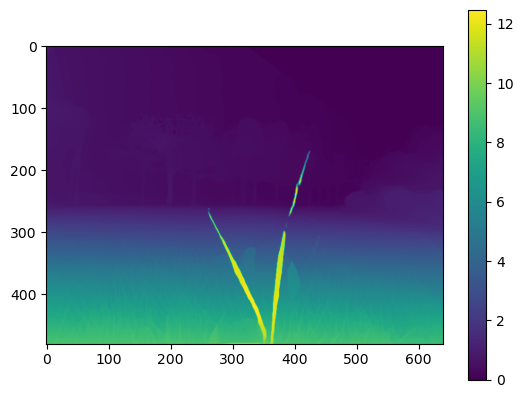

Running on: cuda


100%|██████████| 2000/2000 [00:06<00:00, 285.81it/s]


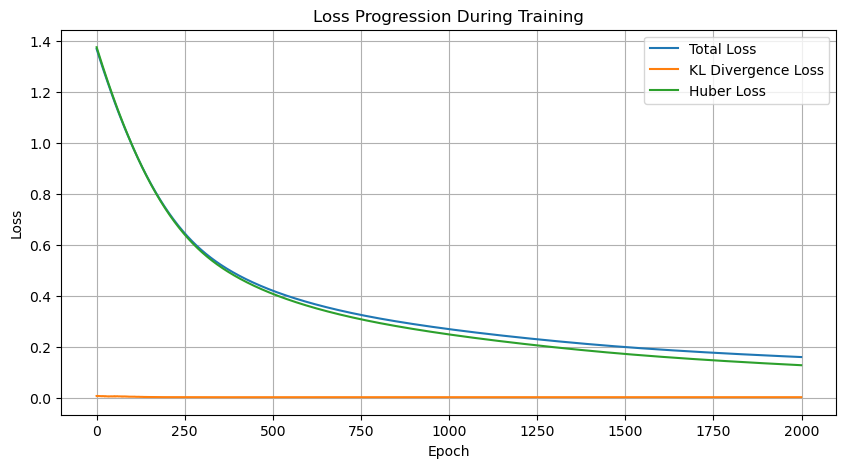

Final refined optimal disp colormap ...


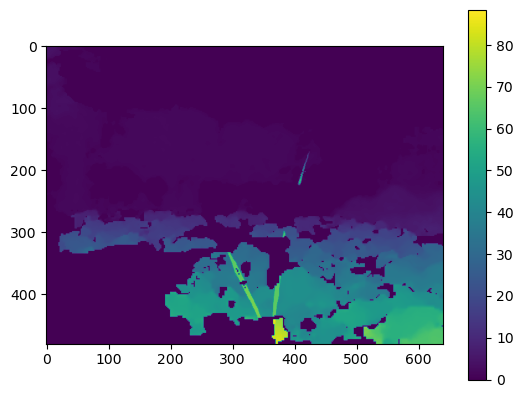

The mean disparity level difference is 0.09694980238059846
Showing difference colormap ...


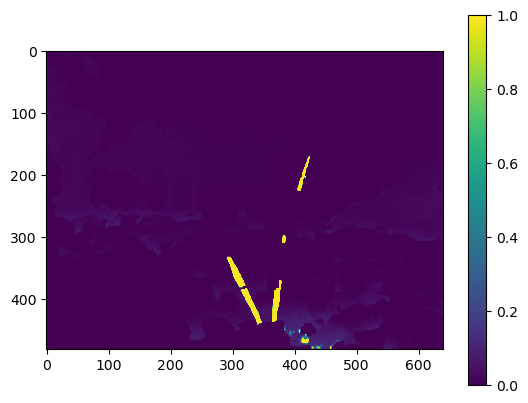

We are processing post disp for target and vit_l for reference...
Showing vit_l reference colormap ...


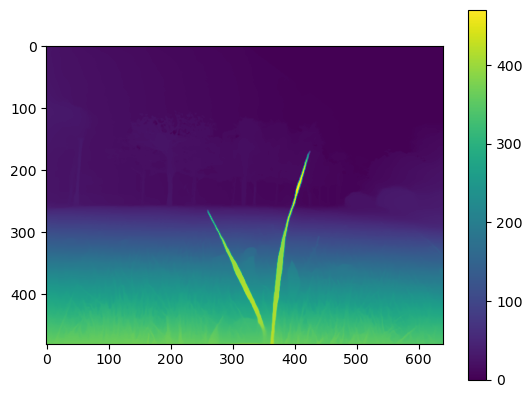

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 265.61it/s]


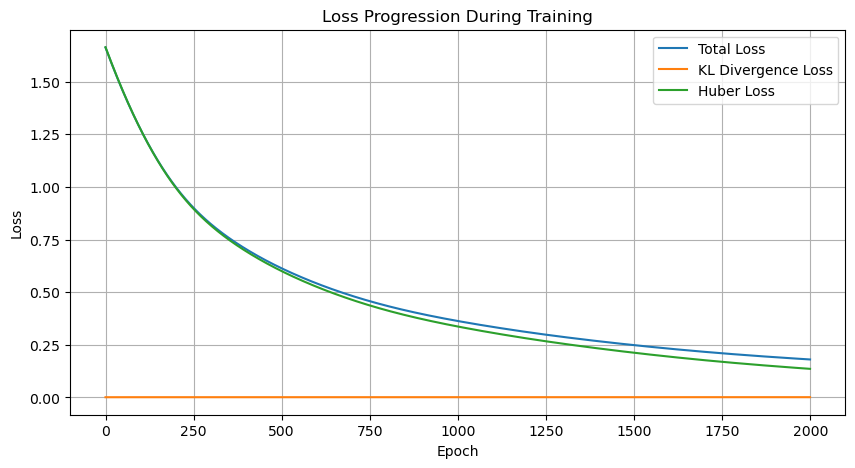

Final refined optimal disp colormap ...


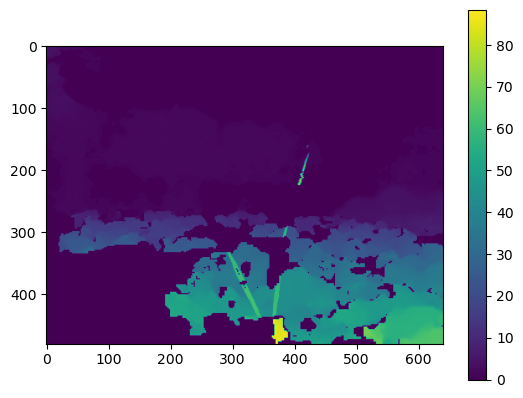

The mean disparity level difference is 0.13035523699674134
Showing difference colormap ...


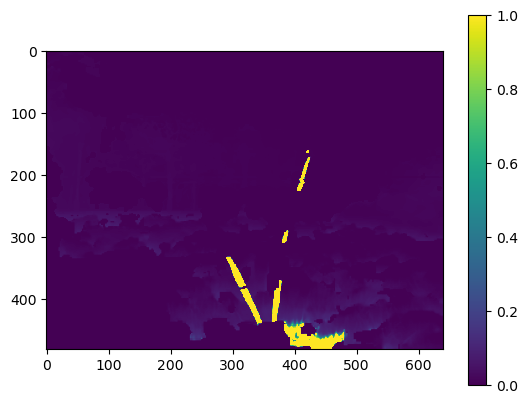

processing 1 now ...
The original input image is: 


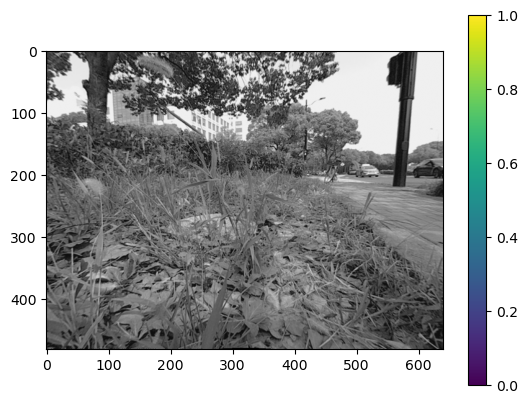

Showing raw disp colormap ...


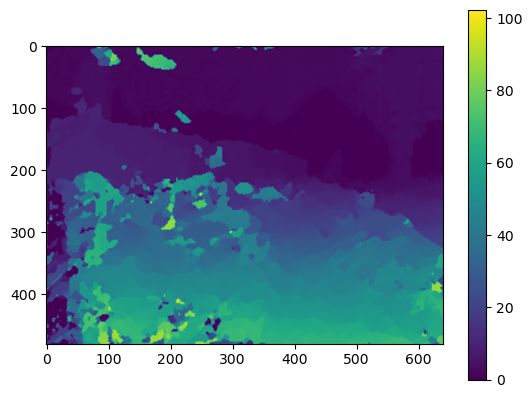

We are processing raw disp for target and vit_s for reference...
Showing vit_s reference colormap ...


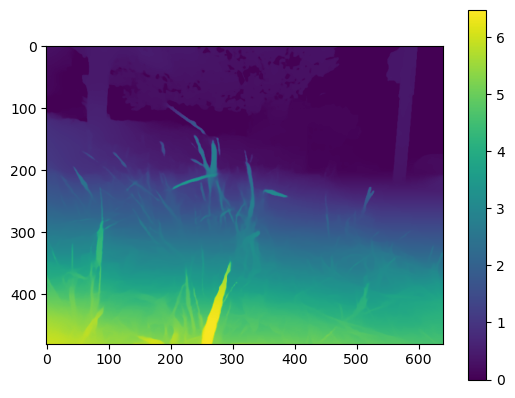

Running on: cuda


100%|██████████| 2000/2000 [00:06<00:00, 318.64it/s]


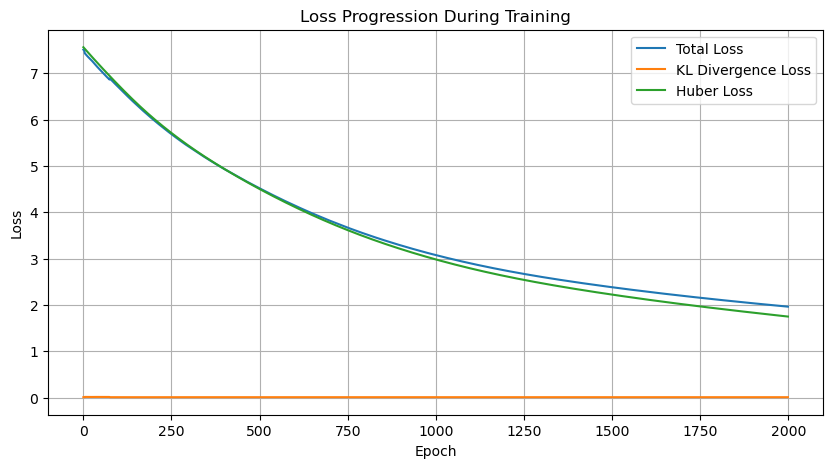

Final refined optimal disp colormap ...


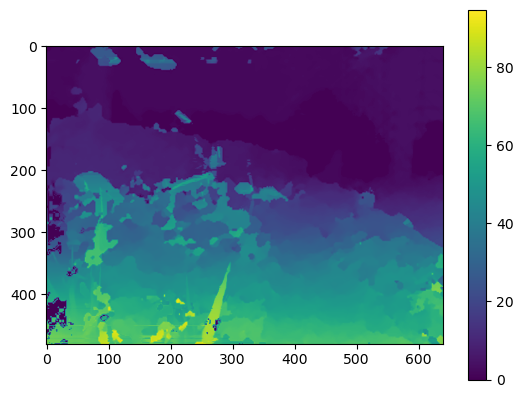

The mean disparity level difference is 0.8478113526552139
Showing difference colormap ...


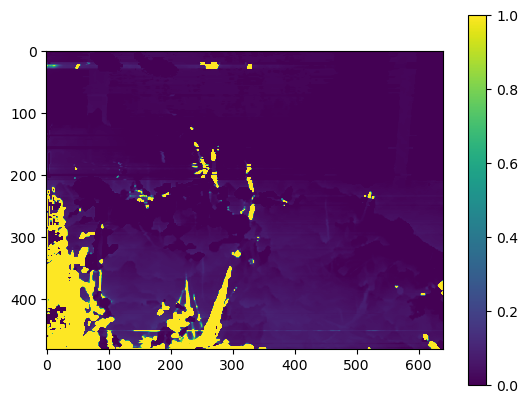

We are processing raw disp for target and vit_b for reference...
Showing vit_b reference colormap ...


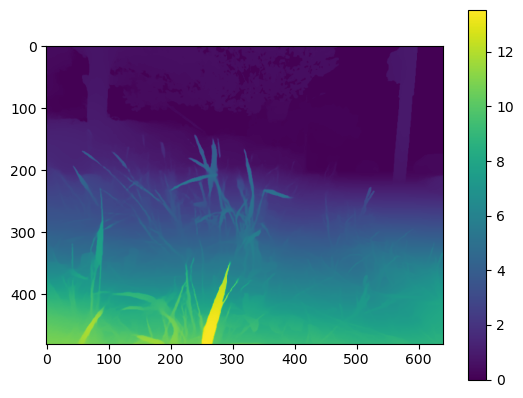

Running on: cuda


100%|██████████| 2000/2000 [00:06<00:00, 299.10it/s]


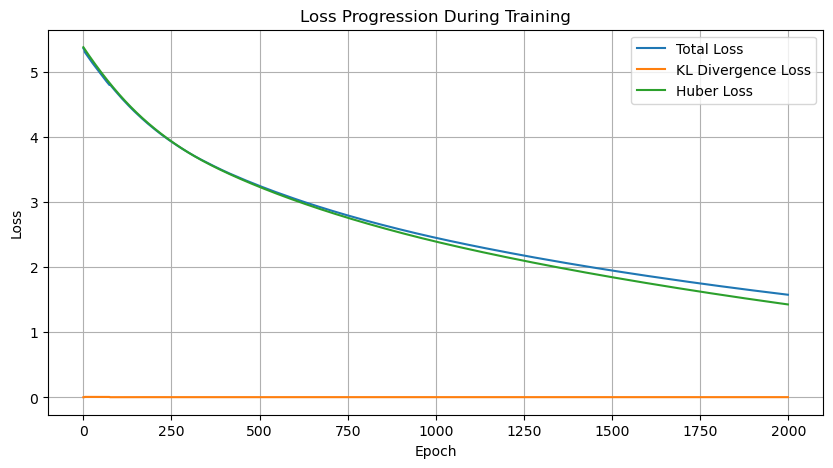

Final refined optimal disp colormap ...


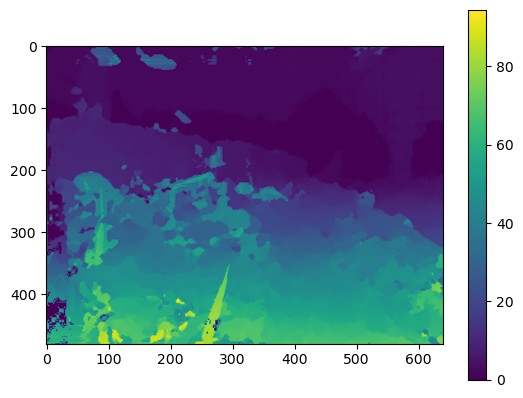

The mean disparity level difference is 0.2873560445852733
Showing difference colormap ...


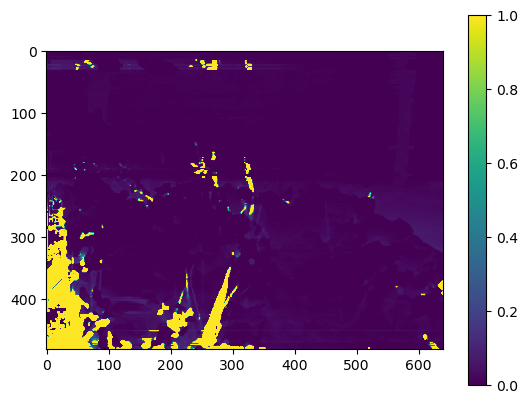

We are processing raw disp for target and vit_l for reference...
Showing vit_l reference colormap ...


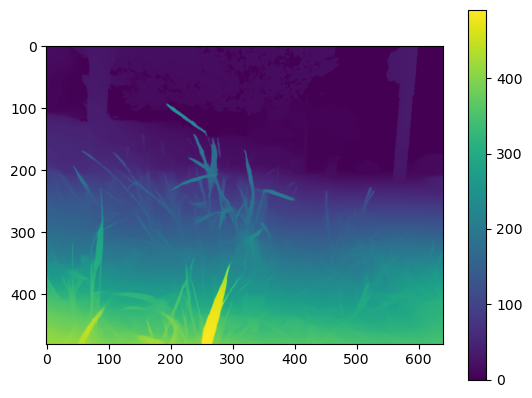

Running on: cuda


100%|██████████| 2000/2000 [00:08<00:00, 229.35it/s]


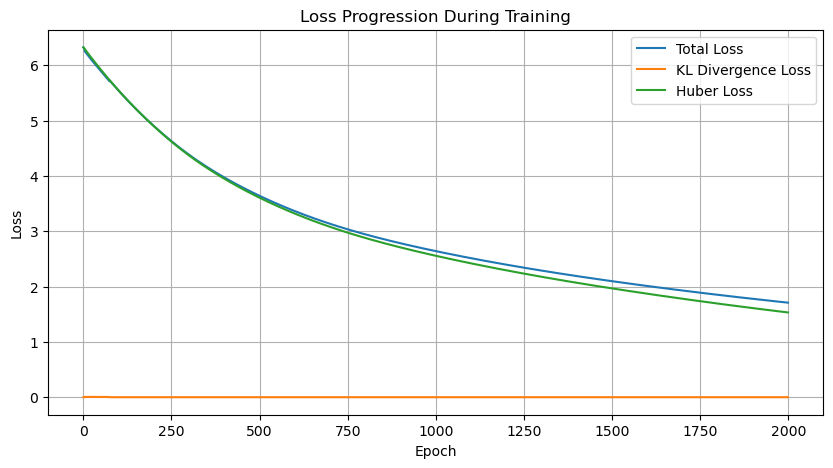

Final refined optimal disp colormap ...


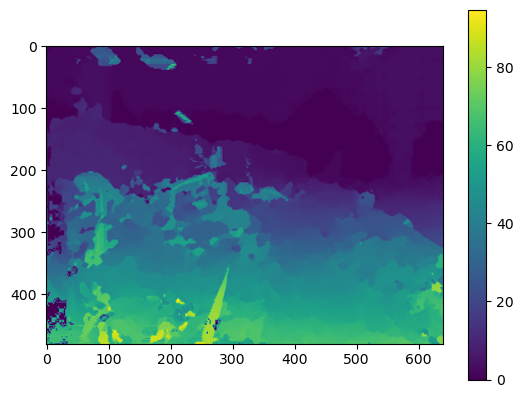

The mean disparity level difference is 0.5569099793815986
Showing difference colormap ...


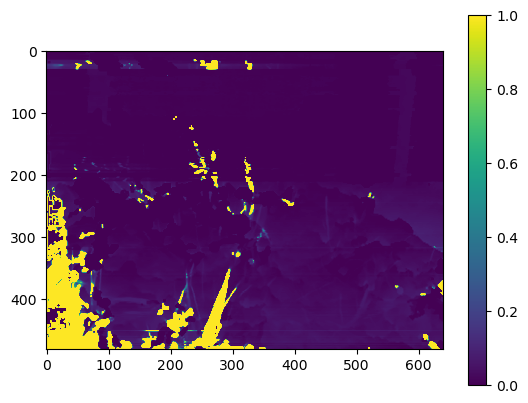

Showing post disp colormap ...


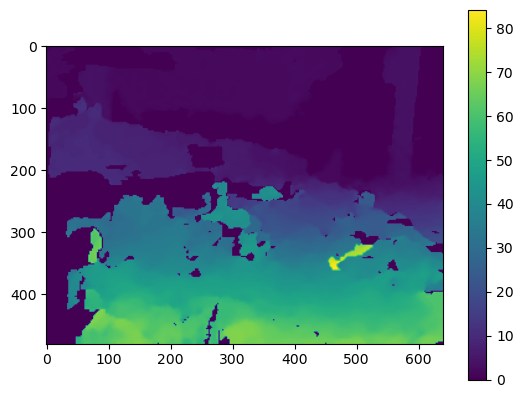

We are processing post disp for target and vit_s for reference...
Showing vit_s reference colormap ...


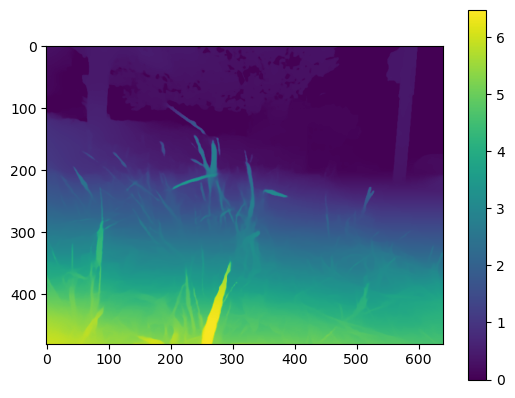

Running on: cuda


100%|██████████| 2000/2000 [00:05<00:00, 354.80it/s]


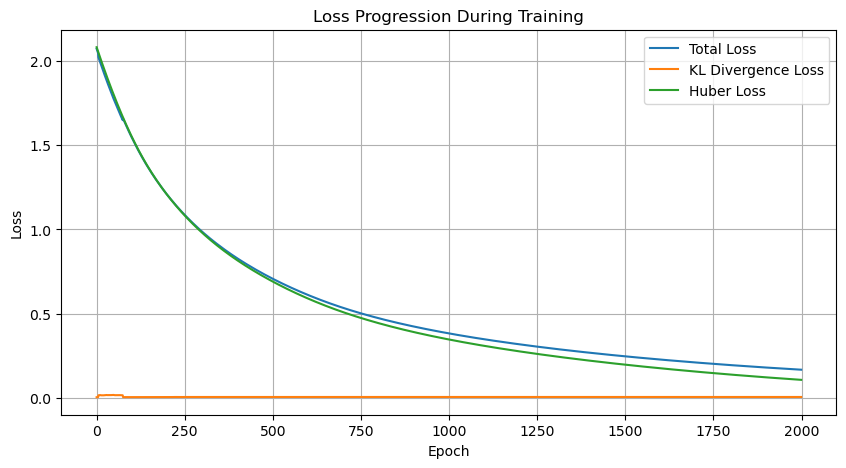

Final refined optimal disp colormap ...


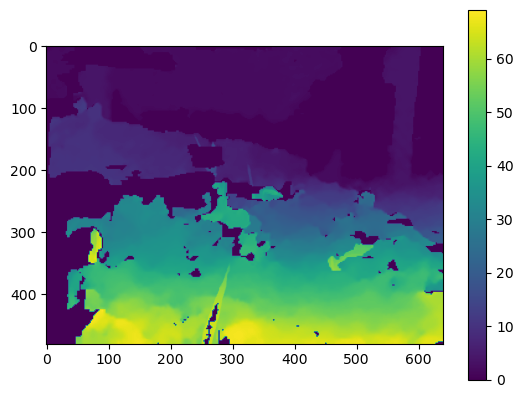

The mean disparity level difference is -0.035438053909844405
Showing difference colormap ...


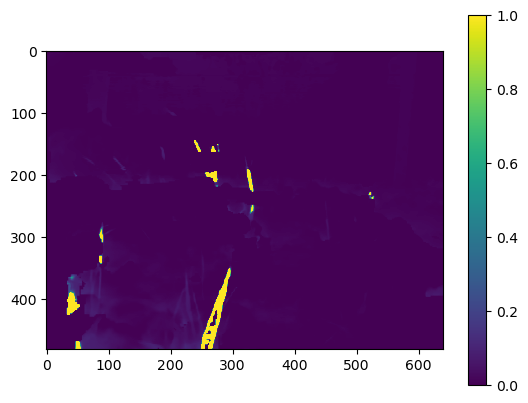

We are processing post disp for target and vit_b for reference...
Showing vit_b reference colormap ...


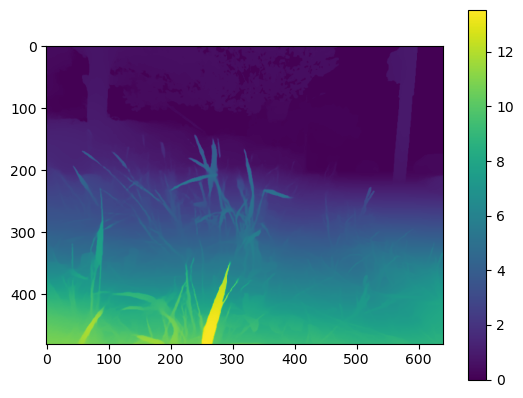

Running on: cuda


100%|██████████| 2000/2000 [00:06<00:00, 332.65it/s]


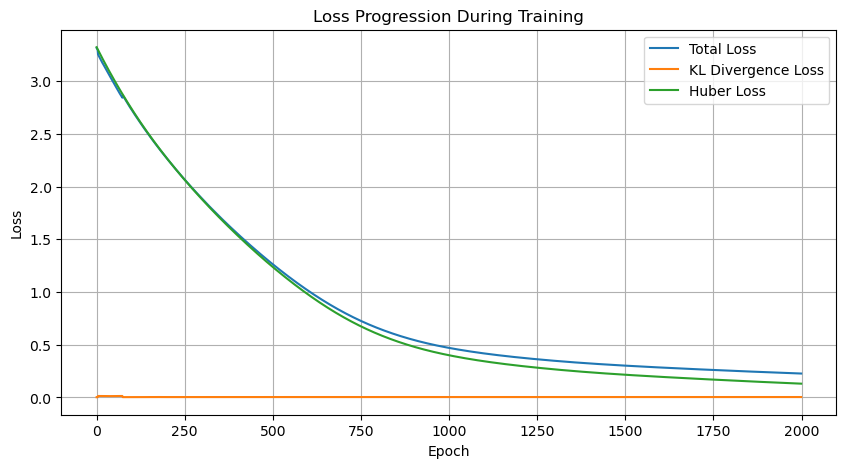

Final refined optimal disp colormap ...


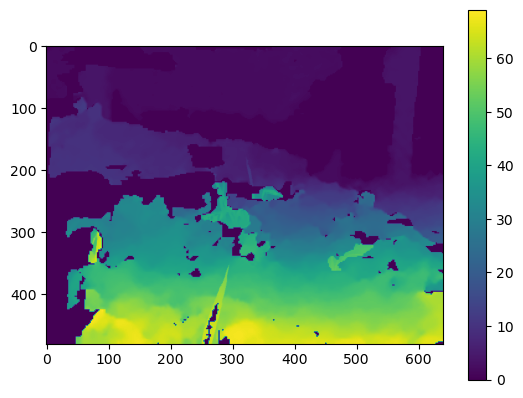

The mean disparity level difference is -0.09808357581418628
Showing difference colormap ...


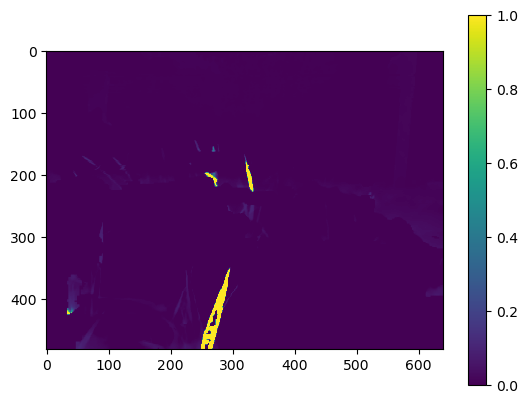

We are processing post disp for target and vit_l for reference...
Showing vit_l reference colormap ...


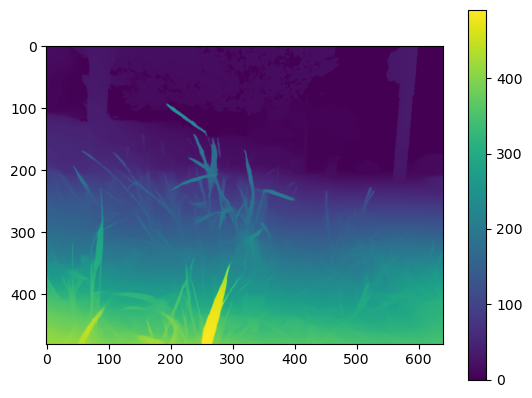

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 276.12it/s]


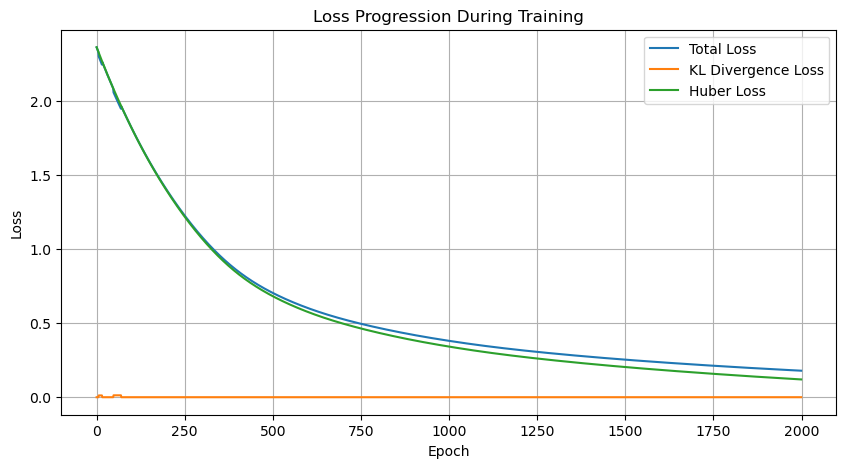

Final refined optimal disp colormap ...


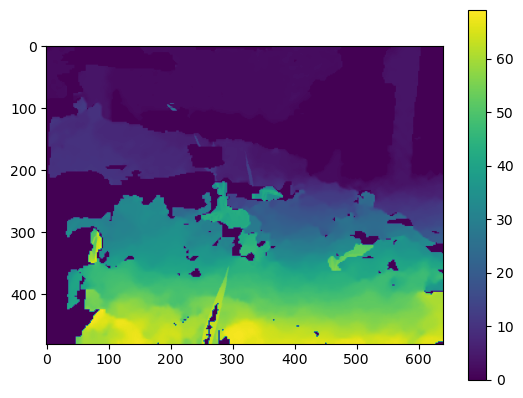

The mean disparity level difference is -0.0589934816393846
Showing difference colormap ...


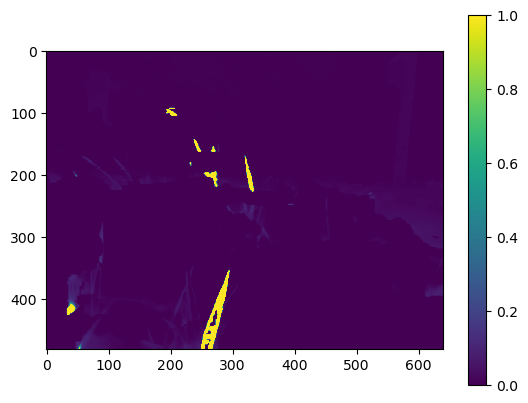

processing 2 now ...
The original input image is: 


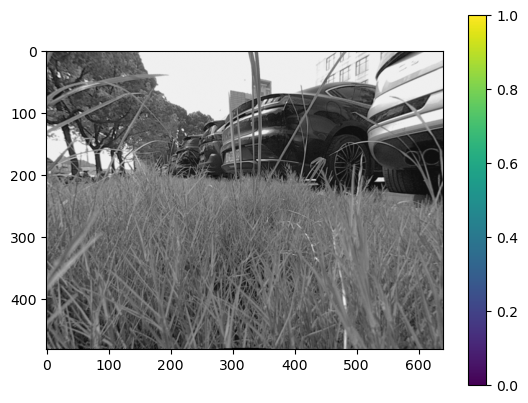

Showing raw disp colormap ...


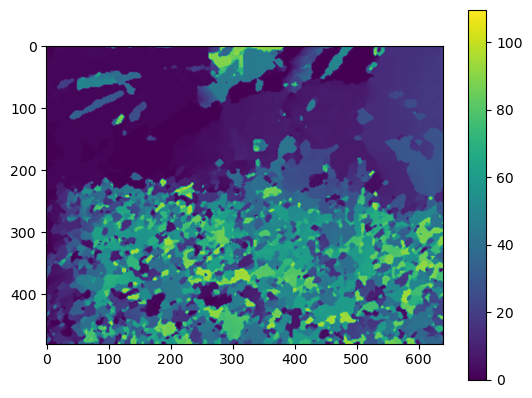

We are processing raw disp for target and vit_s for reference...
Showing vit_s reference colormap ...


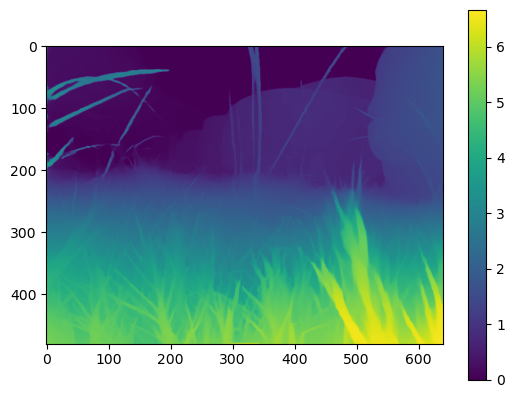

Running on: cuda


100%|██████████| 2000/2000 [00:06<00:00, 288.81it/s]


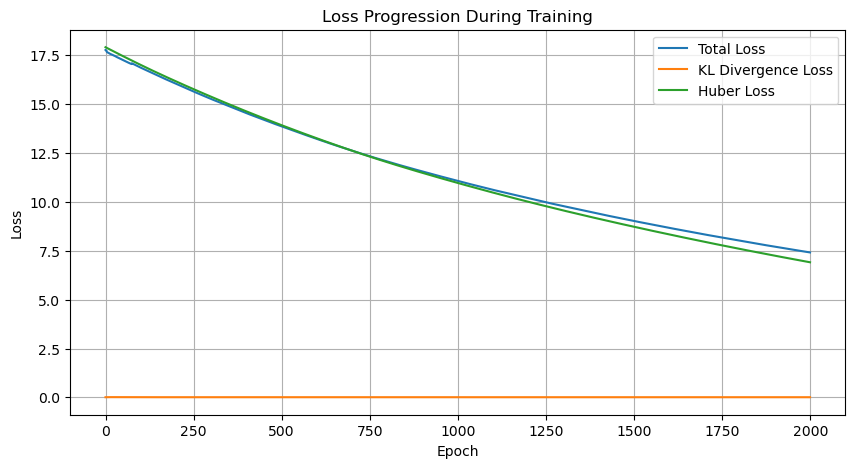

Final refined optimal disp colormap ...


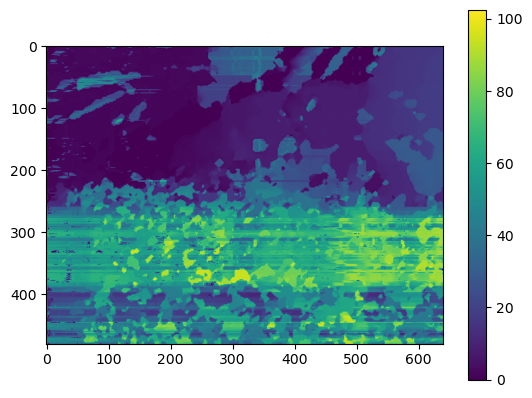

The mean disparity level difference is 3.821684037229279
Showing difference colormap ...


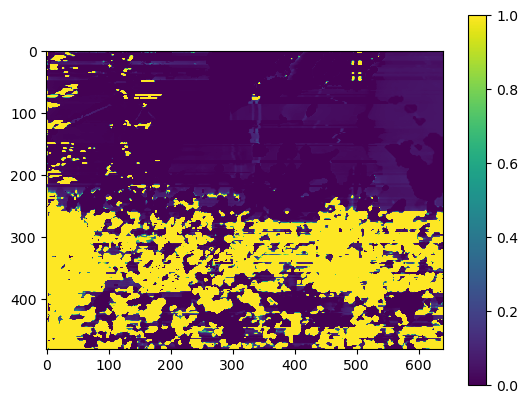

We are processing raw disp for target and vit_b for reference...
Showing vit_b reference colormap ...


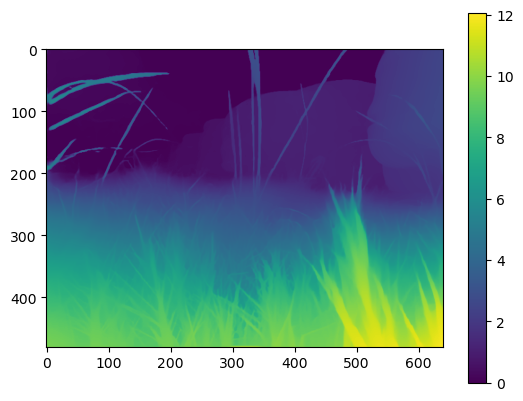

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 274.37it/s]


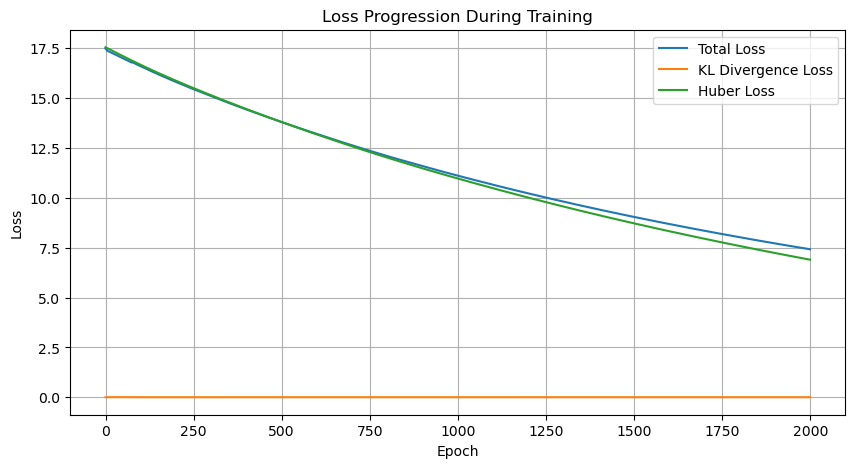

Final refined optimal disp colormap ...


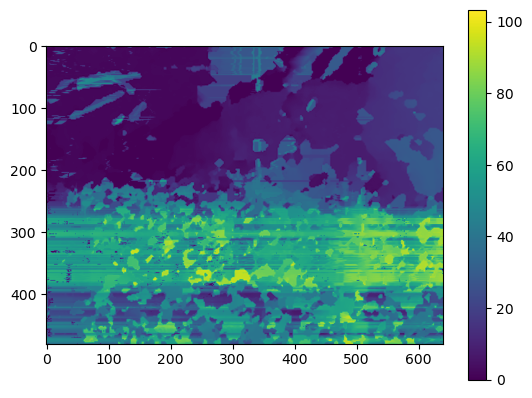

The mean disparity level difference is 3.3275286287791097
Showing difference colormap ...


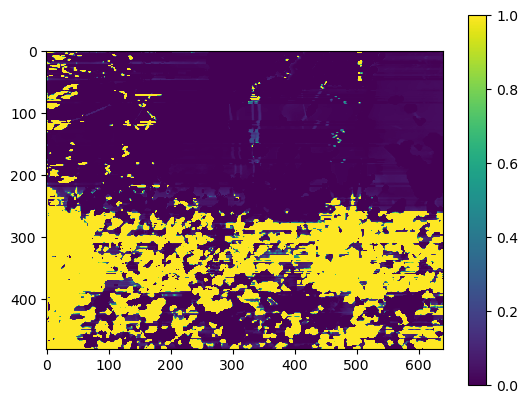

We are processing raw disp for target and vit_l for reference...
Showing vit_l reference colormap ...


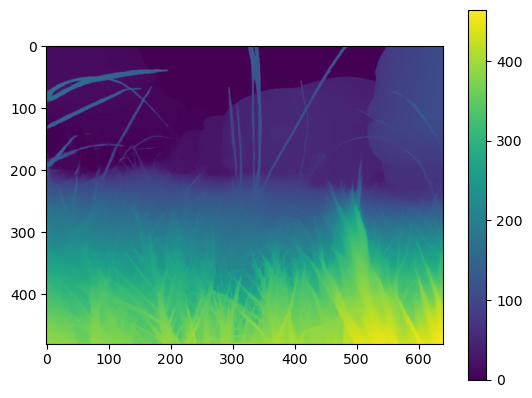

Running on: cuda


100%|██████████| 2000/2000 [00:09<00:00, 208.10it/s]


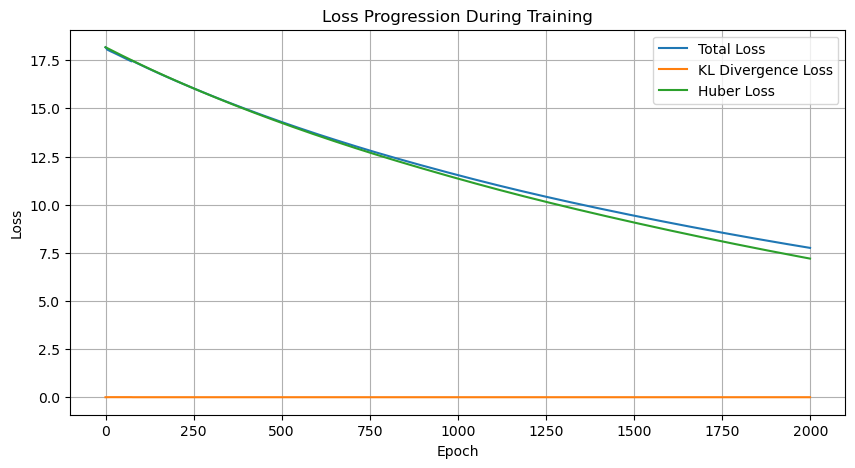

Final refined optimal disp colormap ...


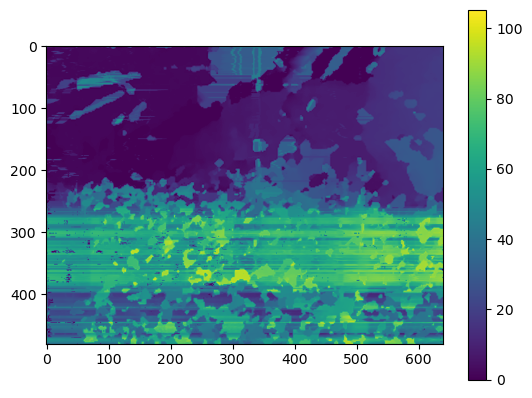

The mean disparity level difference is 4.259452979224346
Showing difference colormap ...


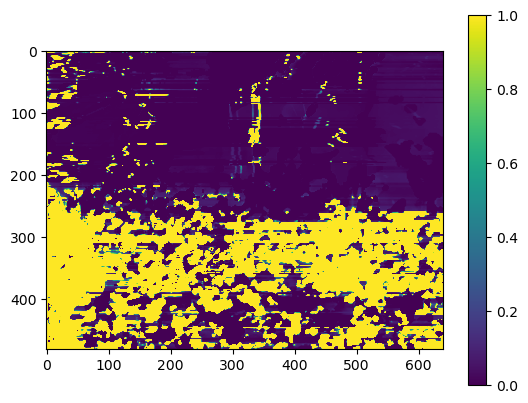

Showing post disp colormap ...


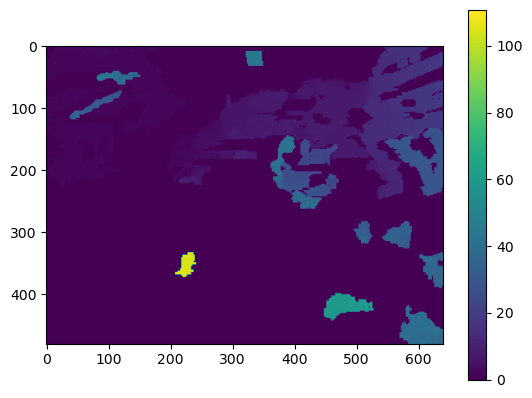

We are processing post disp for target and vit_s for reference...
Showing vit_s reference colormap ...


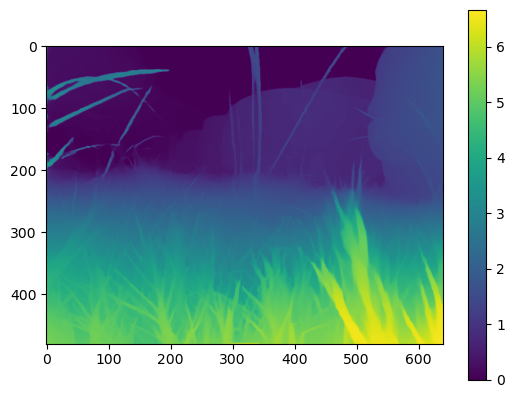

Running on: cuda


100%|██████████| 2000/2000 [00:08<00:00, 241.73it/s]


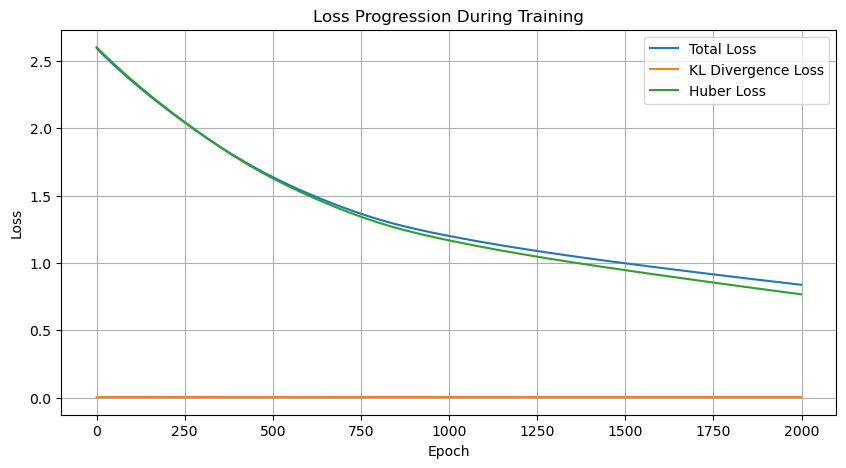

Final refined optimal disp colormap ...


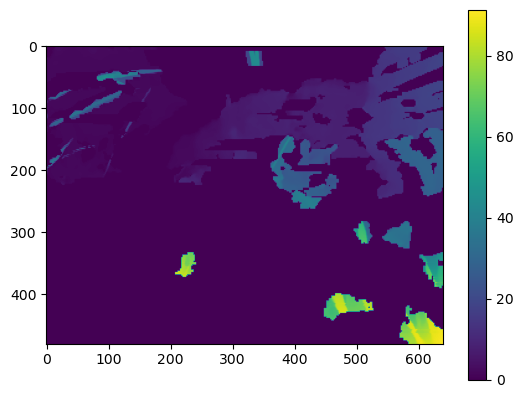

The mean disparity level difference is 0.4840204206396205
Showing difference colormap ...


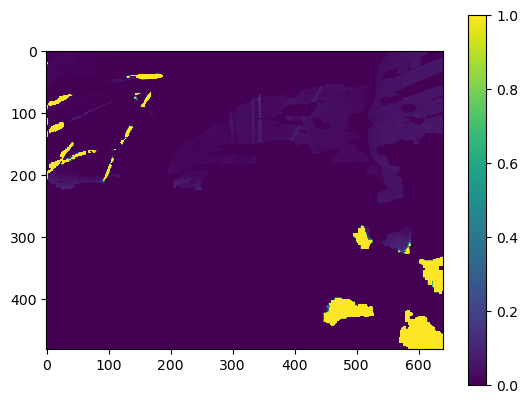

We are processing post disp for target and vit_b for reference...
Showing vit_b reference colormap ...


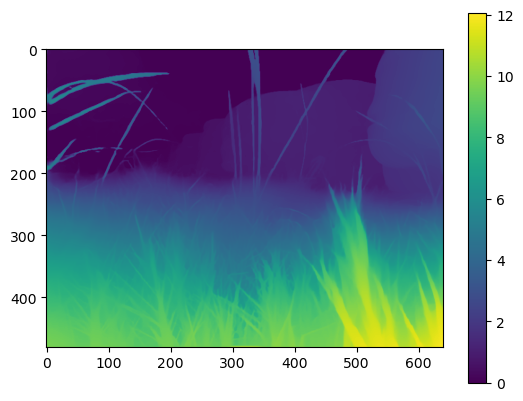

Running on: cuda


100%|██████████| 2000/2000 [00:08<00:00, 241.10it/s]


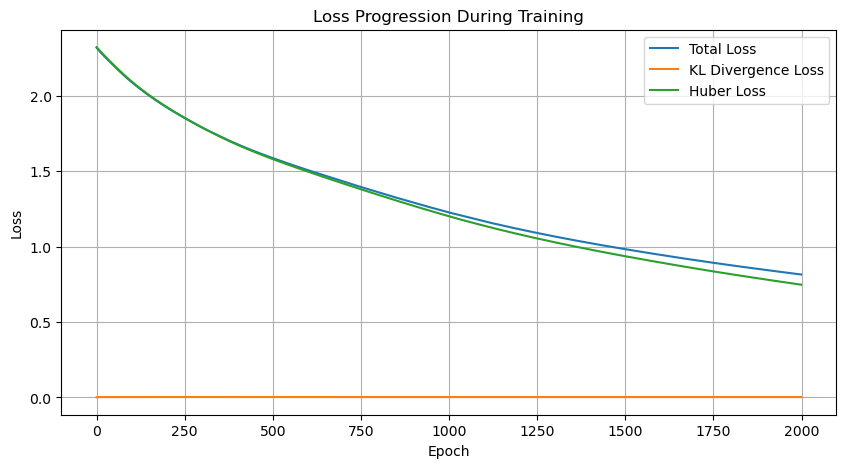

Final refined optimal disp colormap ...


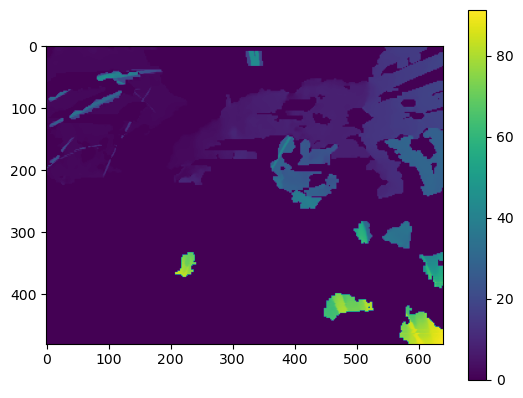

The mean disparity level difference is 0.42869792837960025
Showing difference colormap ...


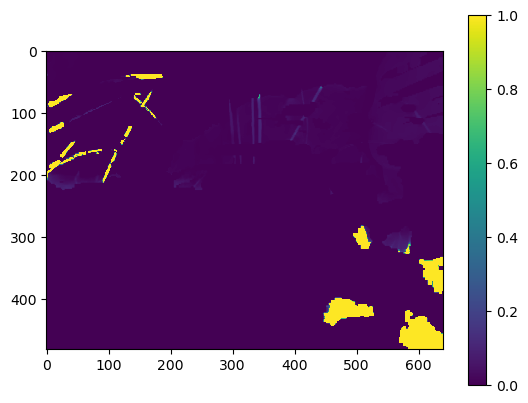

We are processing post disp for target and vit_l for reference...
Showing vit_l reference colormap ...


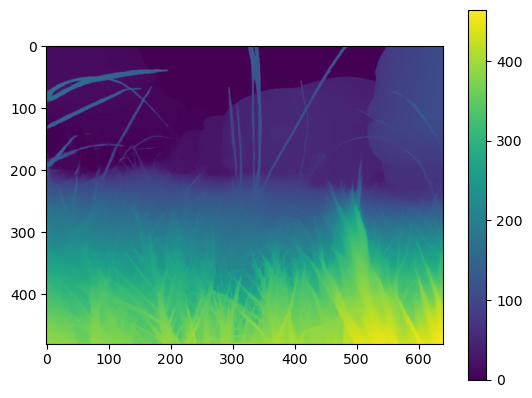

Running on: cuda


100%|██████████| 2000/2000 [00:08<00:00, 245.30it/s]


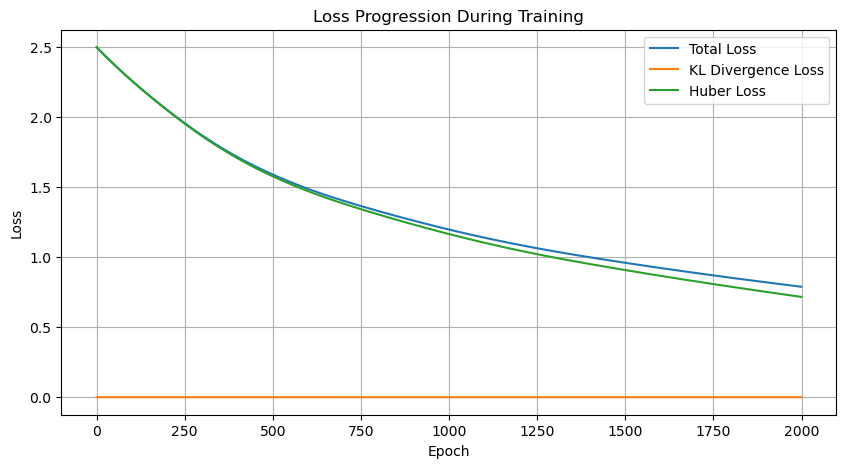

Final refined optimal disp colormap ...


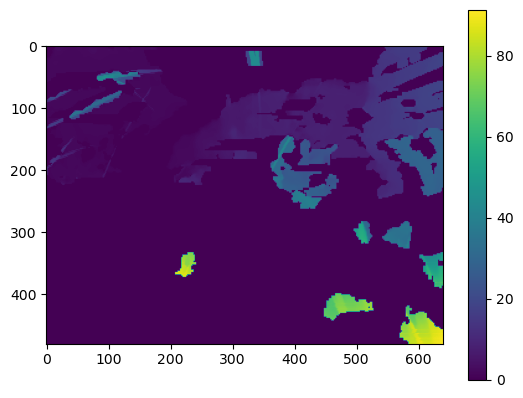

The mean disparity level difference is 0.45376881129302393
Showing difference colormap ...


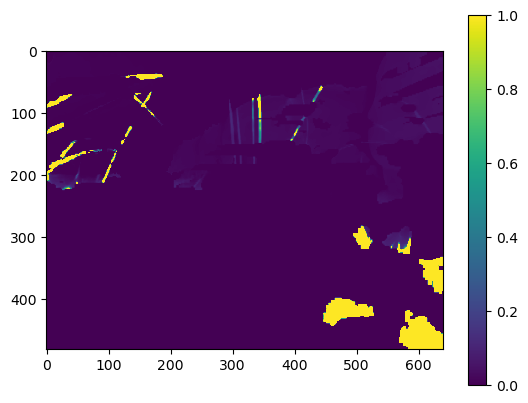

processing 6 now ...
The original input image is: 


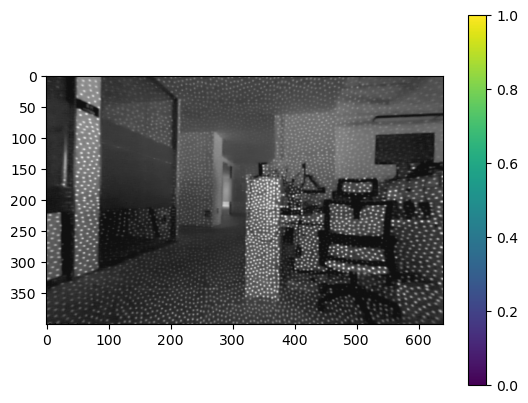

Showing raw disp colormap ...


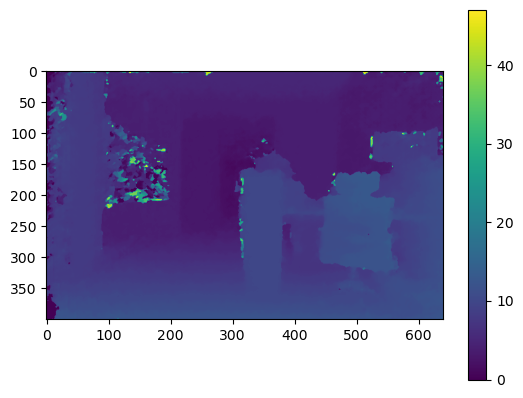

We are processing raw disp for target and vit_s for reference...
Showing vit_s reference colormap ...


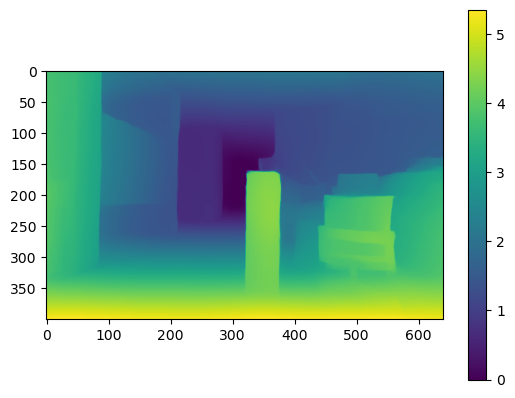

Running on: cuda


100%|██████████| 2000/2000 [00:05<00:00, 335.05it/s]


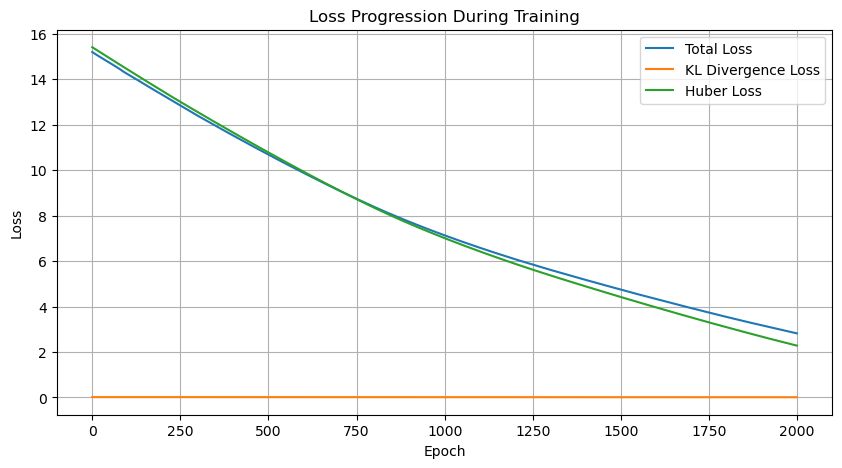

Final refined optimal disp colormap ...


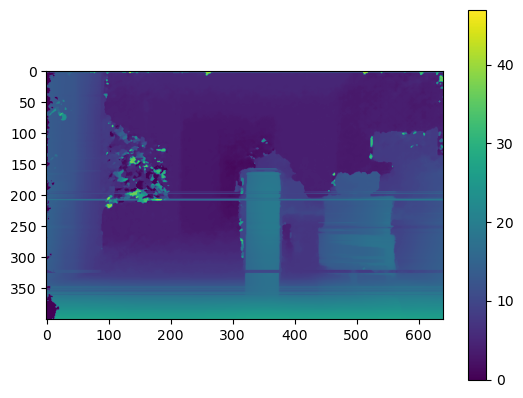

The mean disparity level difference is 2.48340931774769
Showing difference colormap ...


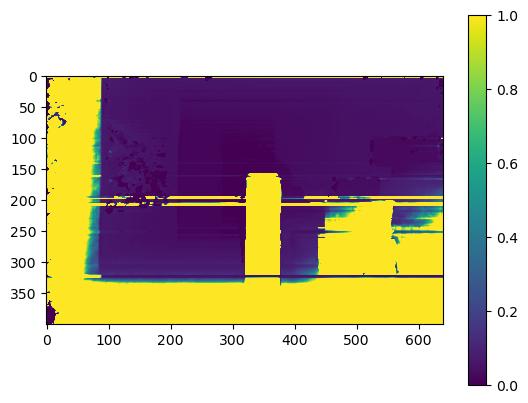

We are processing raw disp for target and vit_b for reference...
Showing vit_b reference colormap ...


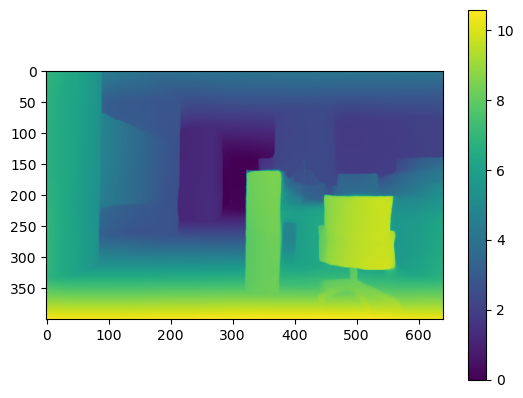

Running on: cuda


100%|██████████| 2000/2000 [00:06<00:00, 332.75it/s]


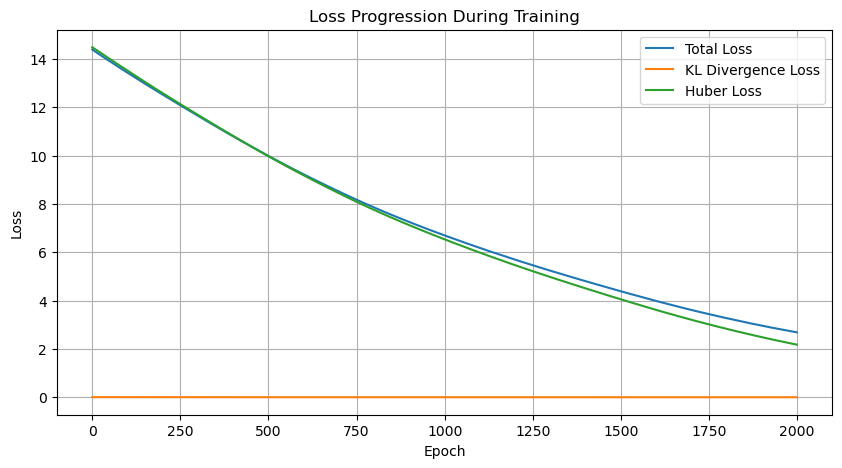

Final refined optimal disp colormap ...


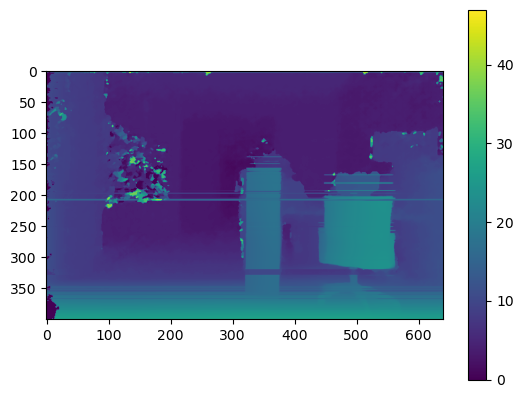

The mean disparity level difference is 2.344028509564232
Showing difference colormap ...


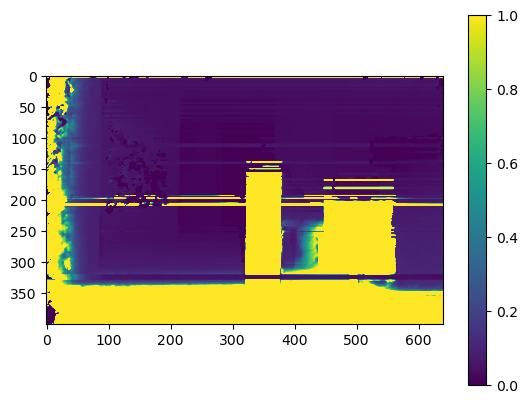

We are processing raw disp for target and vit_l for reference...
Showing vit_l reference colormap ...


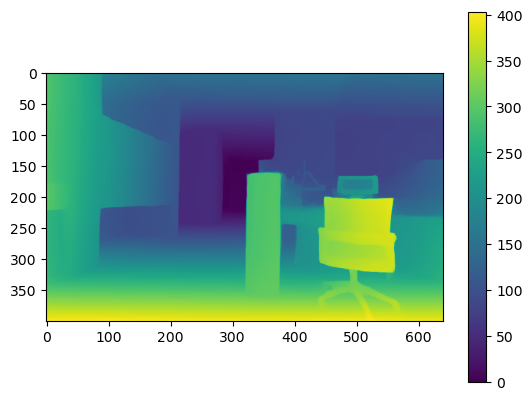

Running on: cuda


100%|██████████| 2000/2000 [00:08<00:00, 244.83it/s]


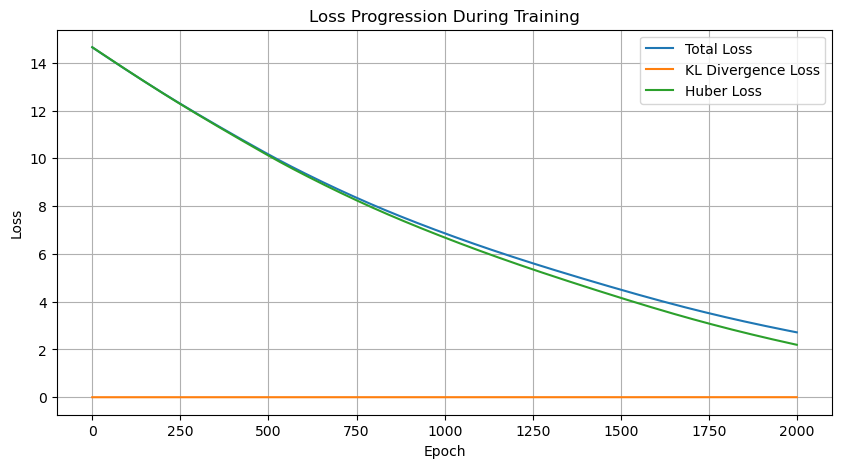

Final refined optimal disp colormap ...


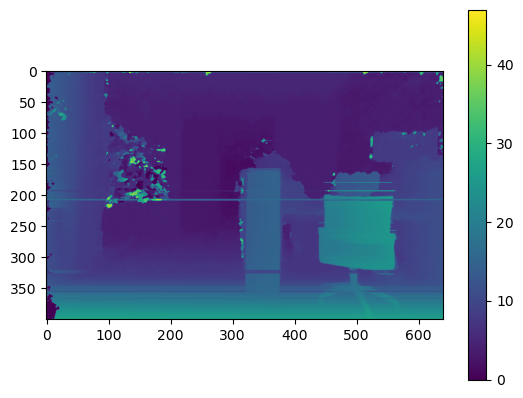

The mean disparity level difference is 2.3712425435236657
Showing difference colormap ...


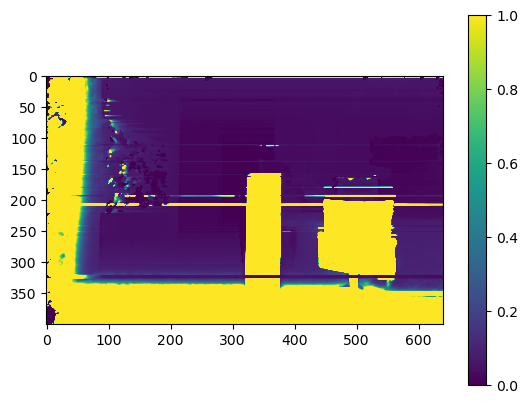

Showing post disp colormap ...


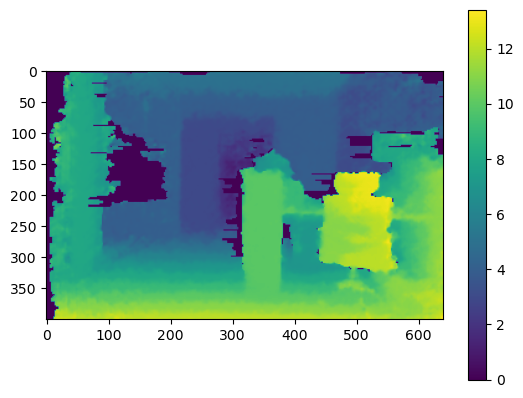

We are processing post disp for target and vit_s for reference...
Showing vit_s reference colormap ...


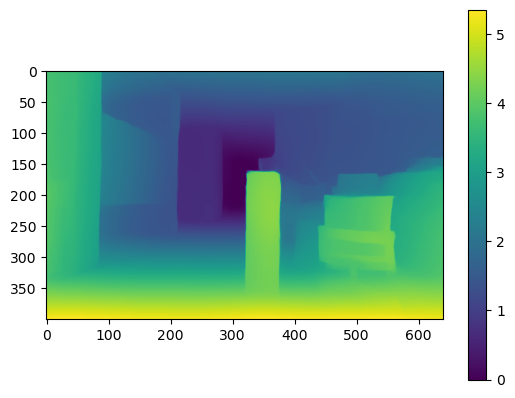

Running on: cuda


100%|██████████| 2000/2000 [00:05<00:00, 382.10it/s]


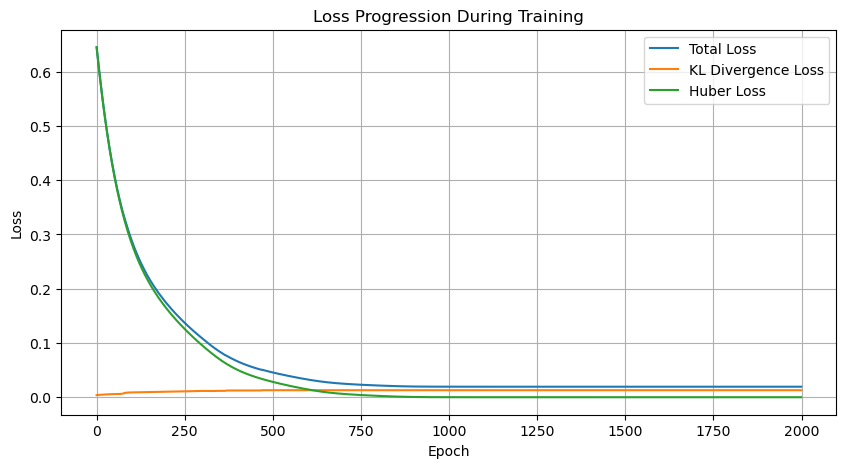

Final refined optimal disp colormap ...


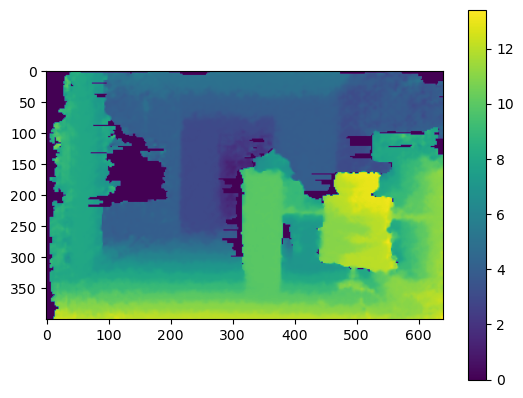

The mean disparity level difference is -0.0023625807329081
Showing difference colormap ...


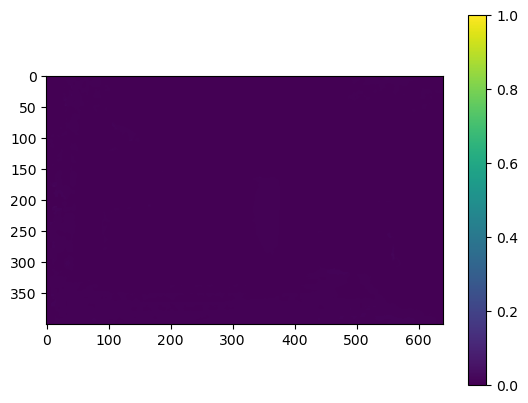

We are processing post disp for target and vit_b for reference...
Showing vit_b reference colormap ...


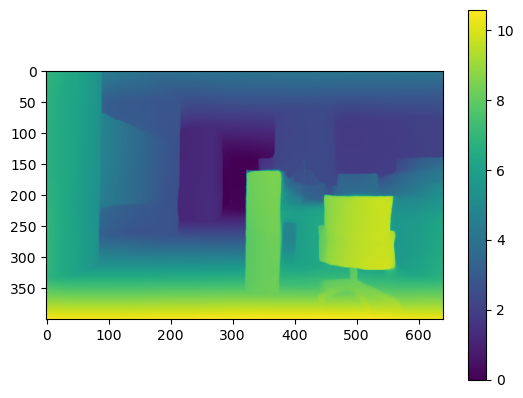

Running on: cuda


100%|██████████| 2000/2000 [00:05<00:00, 366.37it/s]


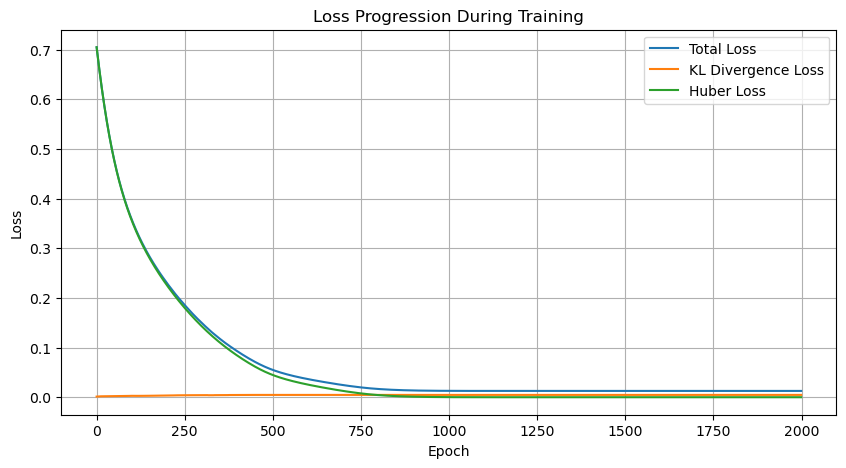

Final refined optimal disp colormap ...


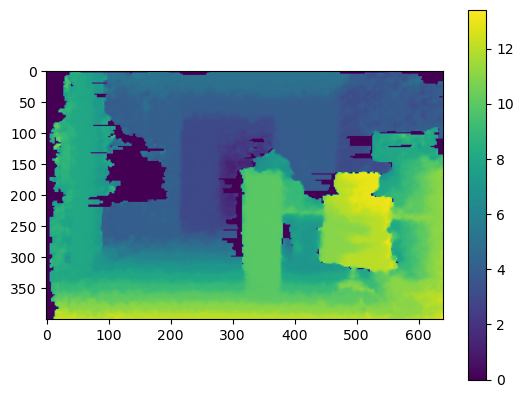

The mean disparity level difference is -0.003548484974075109
Showing difference colormap ...


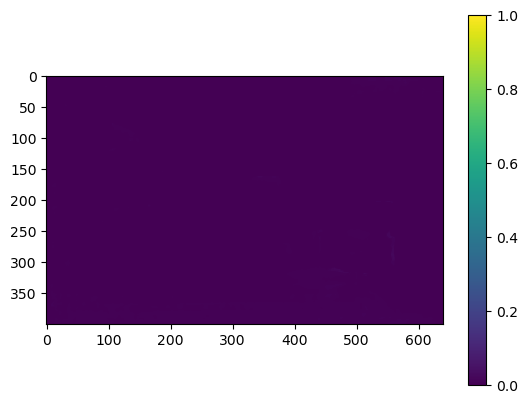

We are processing post disp for target and vit_l for reference...
Showing vit_l reference colormap ...


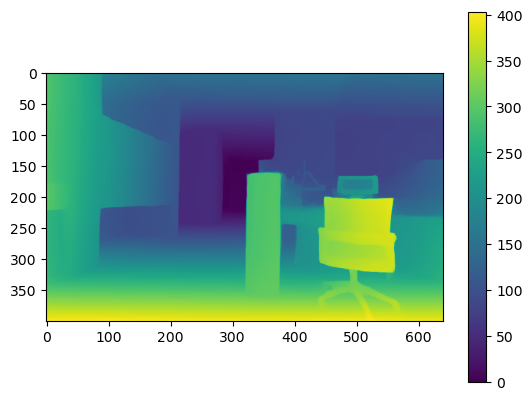

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 275.06it/s]


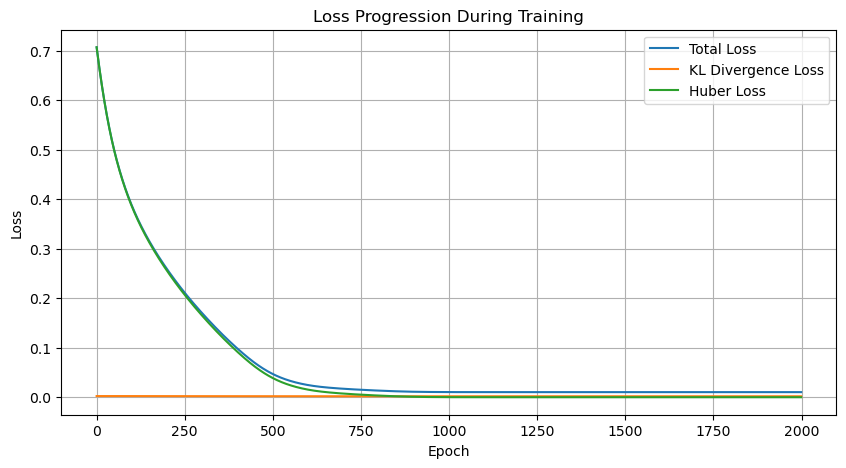

Final refined optimal disp colormap ...


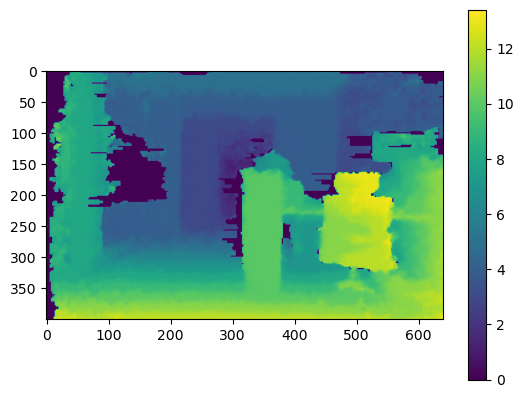

The mean disparity level difference is -0.0034951860676519573
Showing difference colormap ...


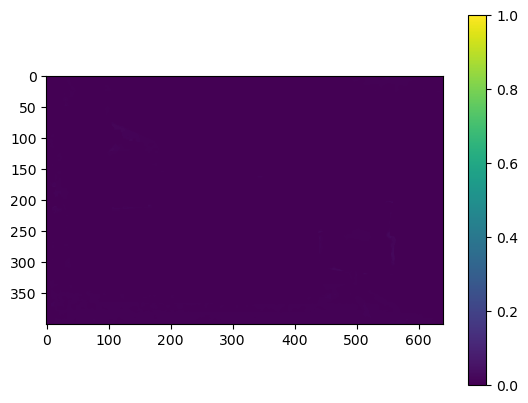

processing 3 now ...
The original input image is: 


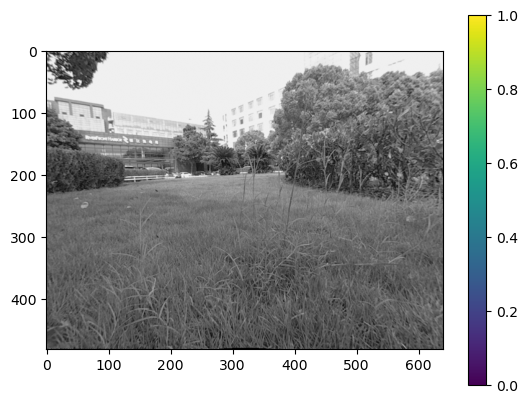

Showing raw disp colormap ...


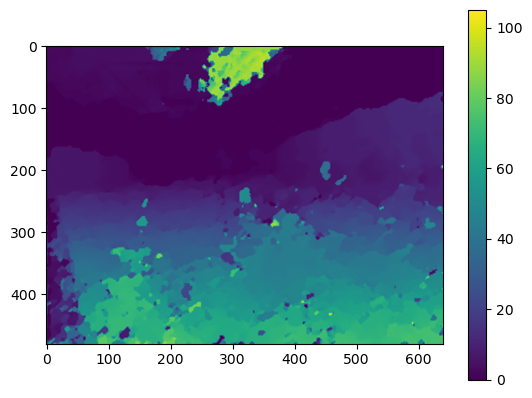

We are processing raw disp for target and vit_s for reference...
Showing vit_s reference colormap ...


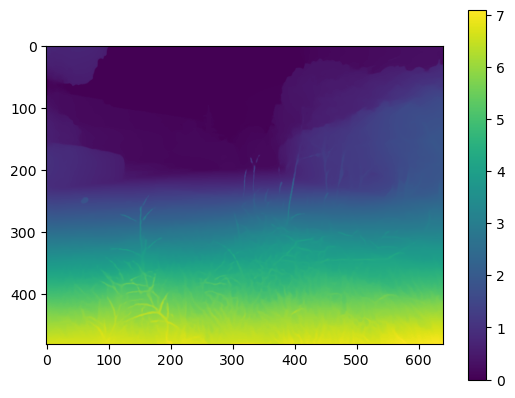

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 281.37it/s]


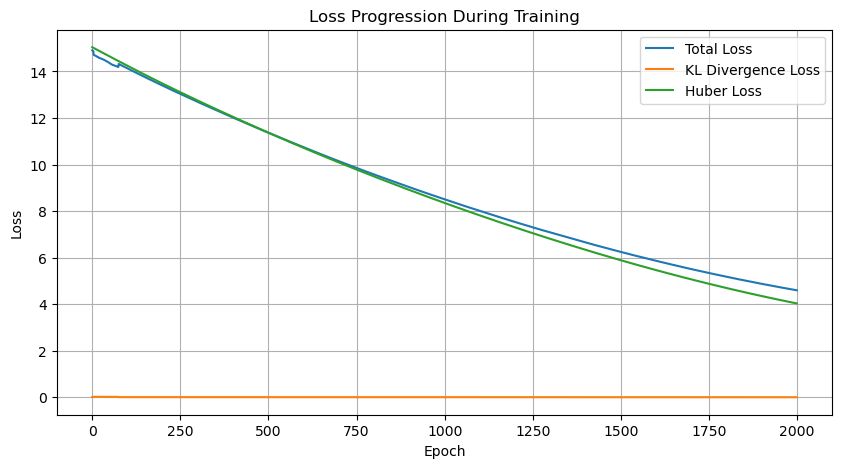

Final refined optimal disp colormap ...


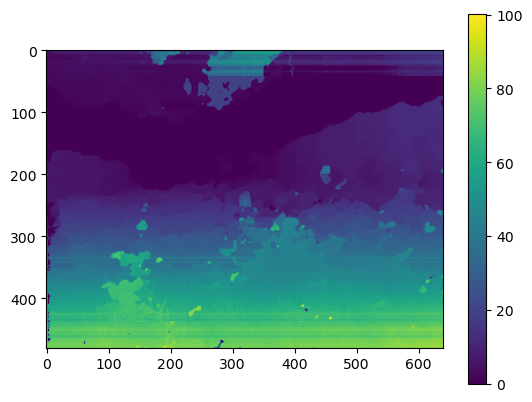

The mean disparity level difference is 2.1363152772537433
Showing difference colormap ...


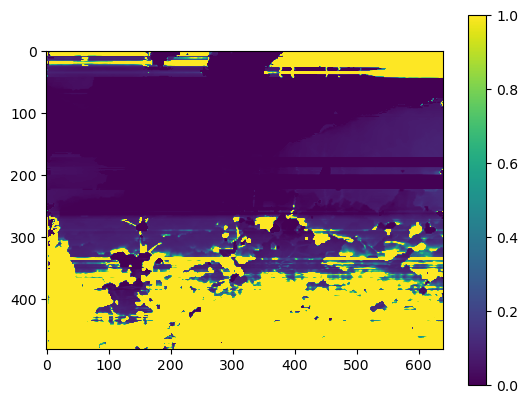

We are processing raw disp for target and vit_b for reference...
Showing vit_b reference colormap ...


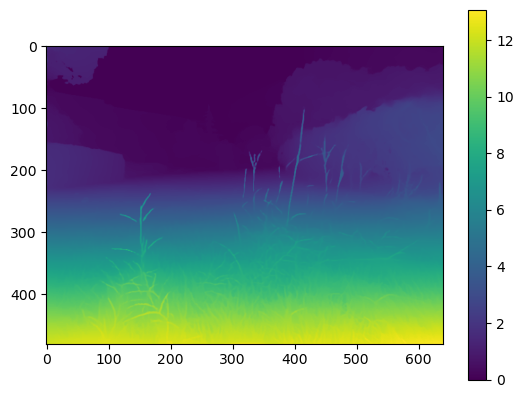

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 276.27it/s]


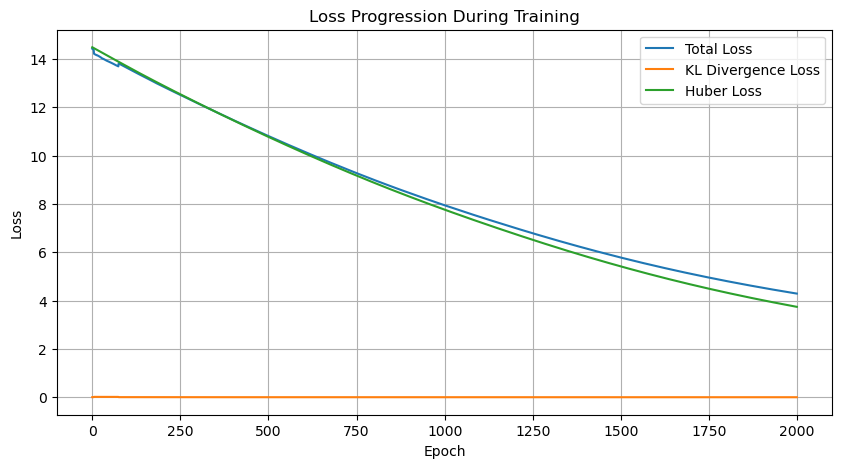

Final refined optimal disp colormap ...


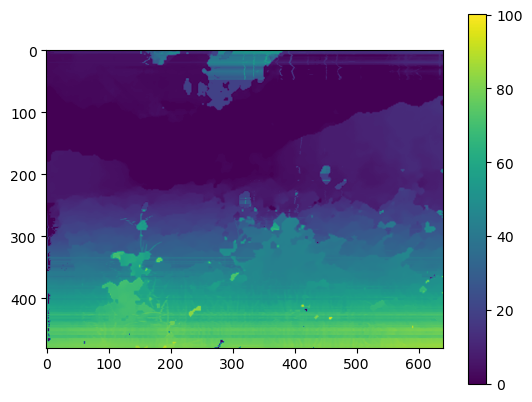

The mean disparity level difference is 1.7949494777076567
Showing difference colormap ...


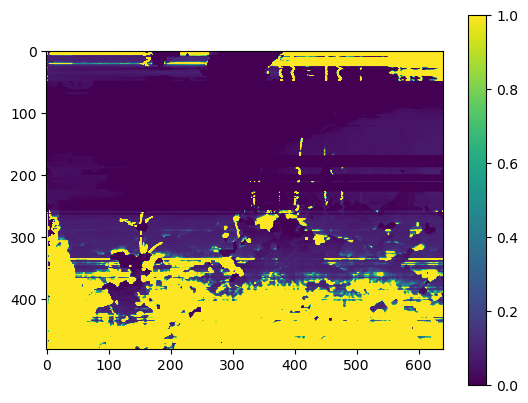

We are processing raw disp for target and vit_l for reference...
Showing vit_l reference colormap ...


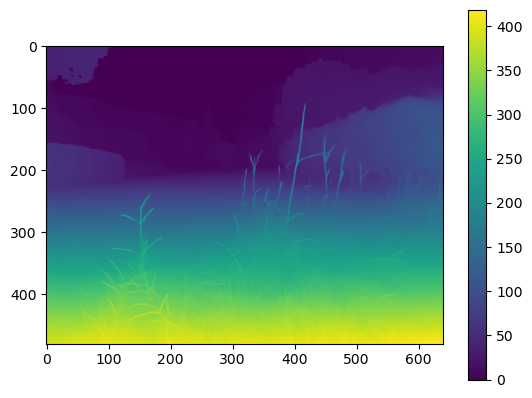

Running on: cuda


100%|██████████| 2000/2000 [00:08<00:00, 233.24it/s]


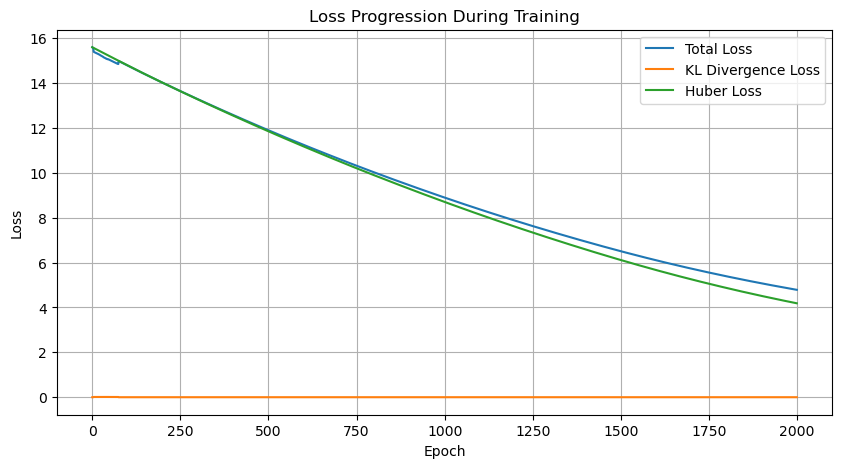

Final refined optimal disp colormap ...


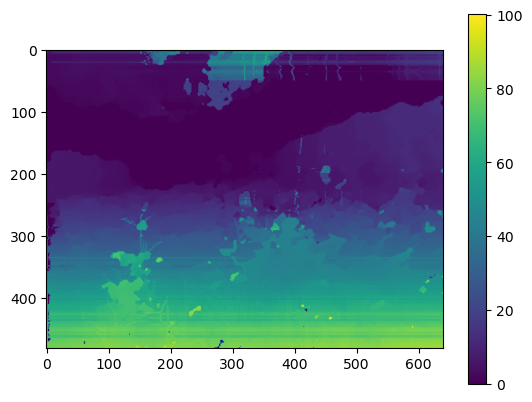

The mean disparity level difference is 2.34786026394926
Showing difference colormap ...


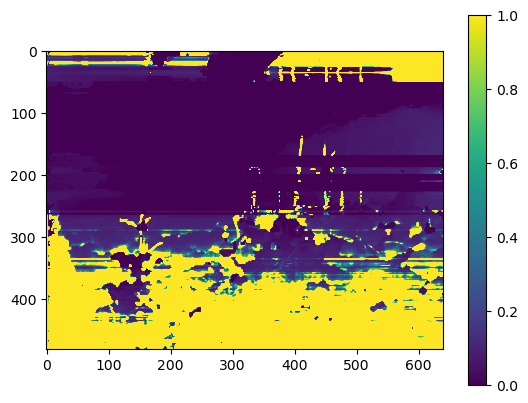

Showing post disp colormap ...


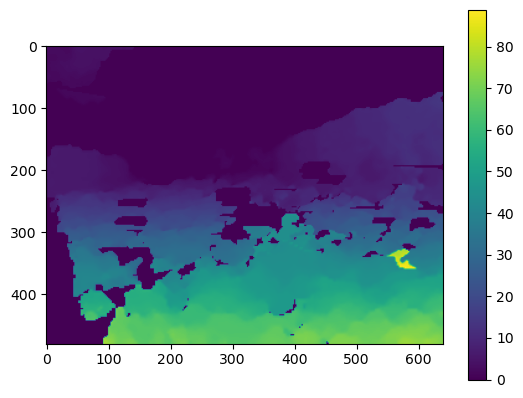

We are processing post disp for target and vit_s for reference...
Showing vit_s reference colormap ...


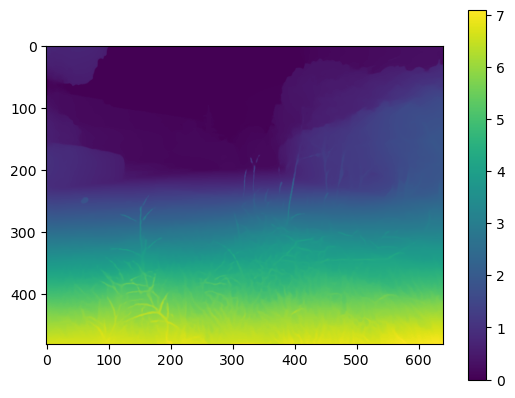

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 284.99it/s]


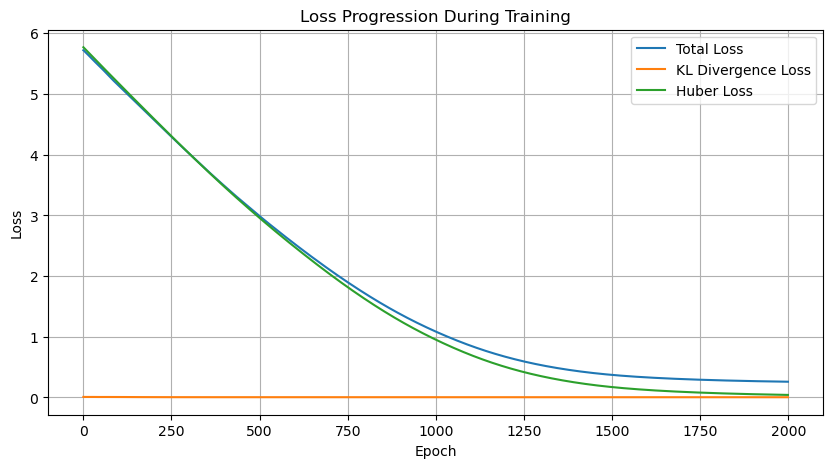

Final refined optimal disp colormap ...


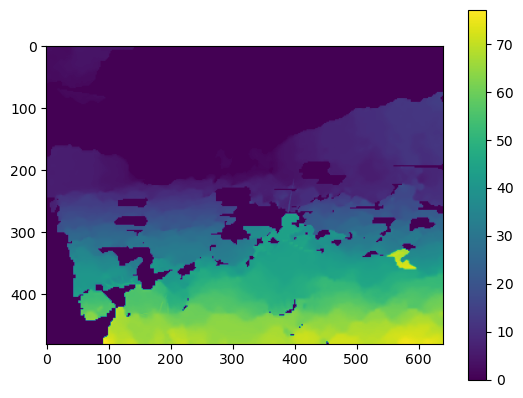

The mean disparity level difference is 0.042365680596170324
Showing difference colormap ...


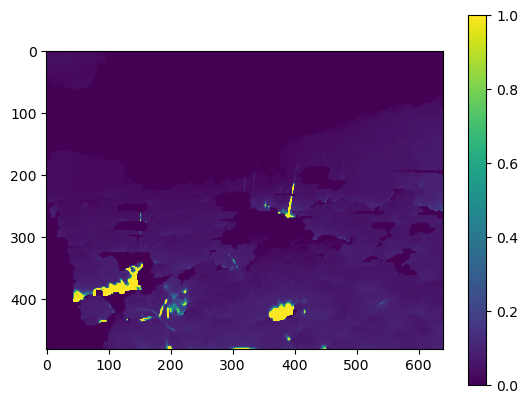

We are processing post disp for target and vit_b for reference...
Showing vit_b reference colormap ...


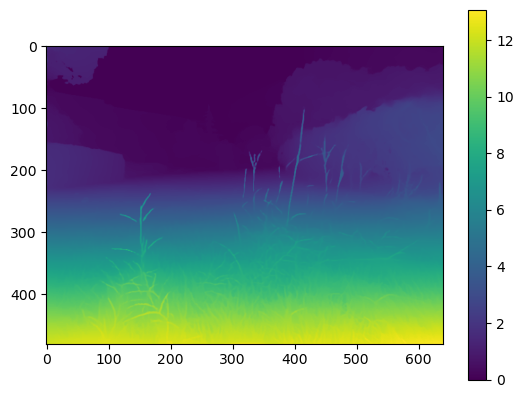

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 277.79it/s]


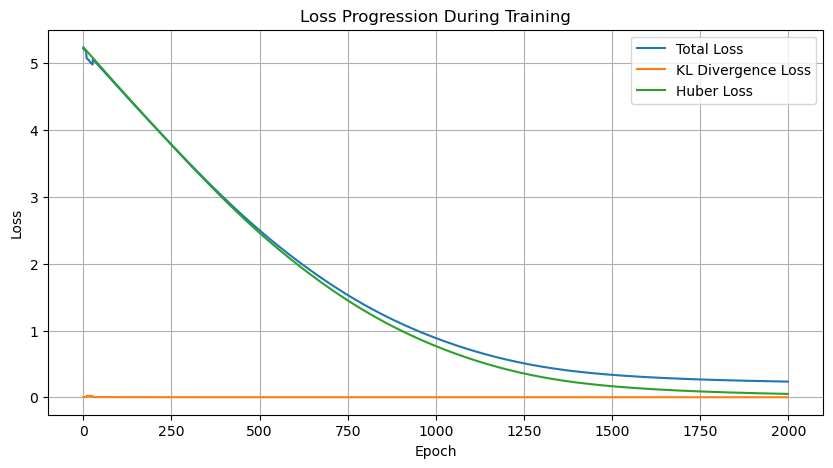

Final refined optimal disp colormap ...


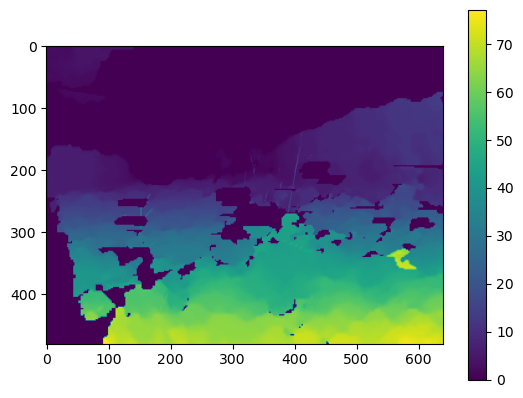

The mean disparity level difference is 0.04317030808965986
Showing difference colormap ...


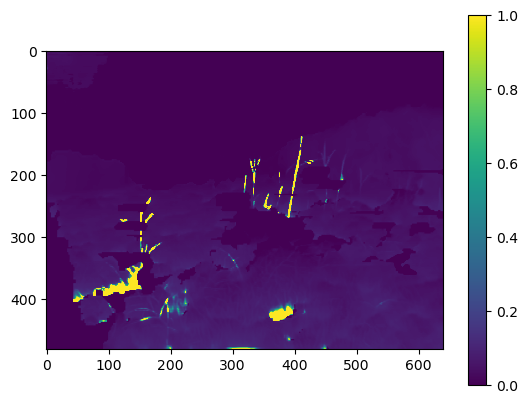

We are processing post disp for target and vit_l for reference...
Showing vit_l reference colormap ...


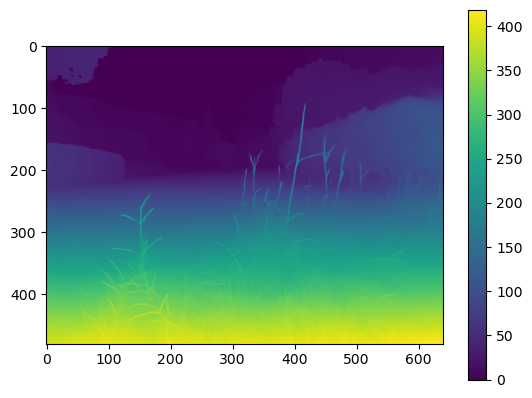

Running on: cuda


100%|██████████| 2000/2000 [00:08<00:00, 243.03it/s]


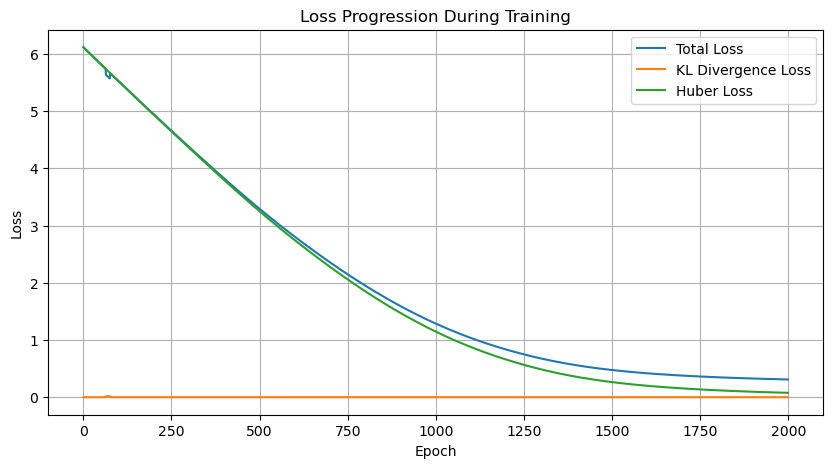

Final refined optimal disp colormap ...


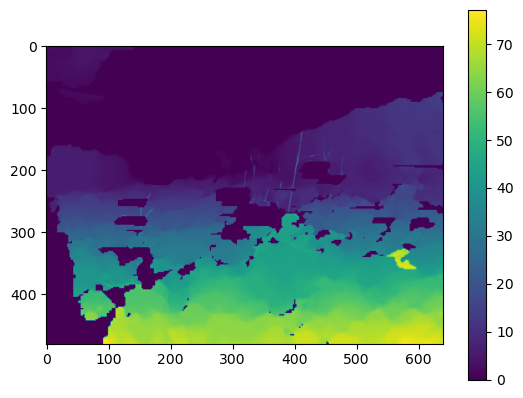

The mean disparity level difference is 0.08317769070543969
Showing difference colormap ...


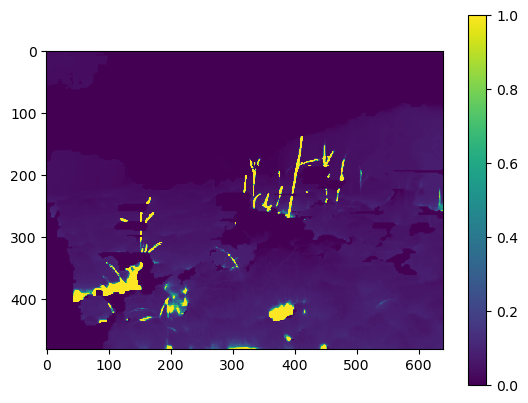

processing 5 now ...
The original input image is: 


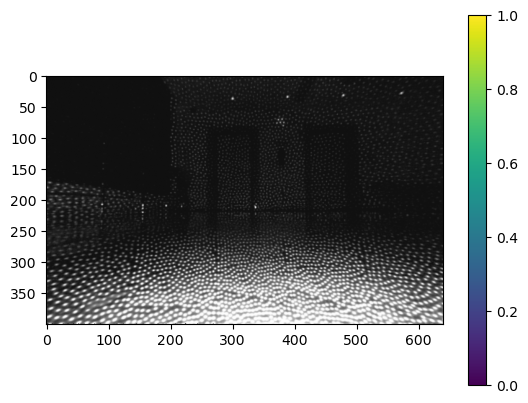

Showing raw disp colormap ...


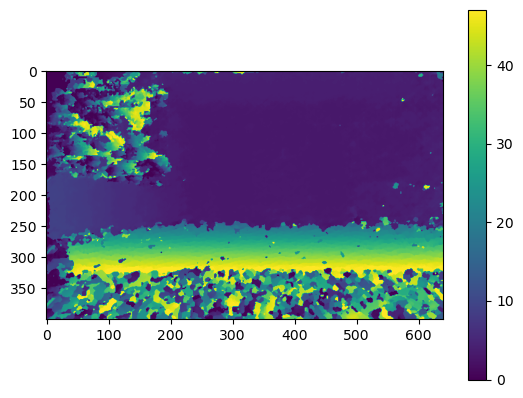

We are processing raw disp for target and vit_s for reference...
Showing vit_s reference colormap ...


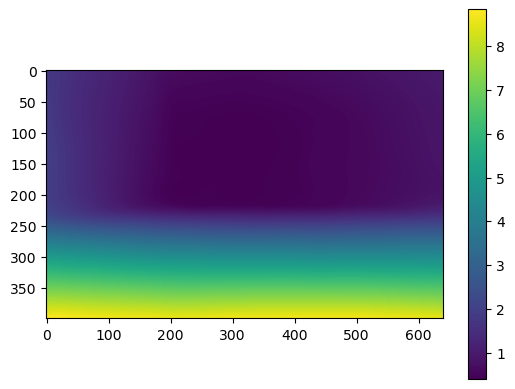

Running on: cuda


100%|██████████| 2000/2000 [00:05<00:00, 398.64it/s]


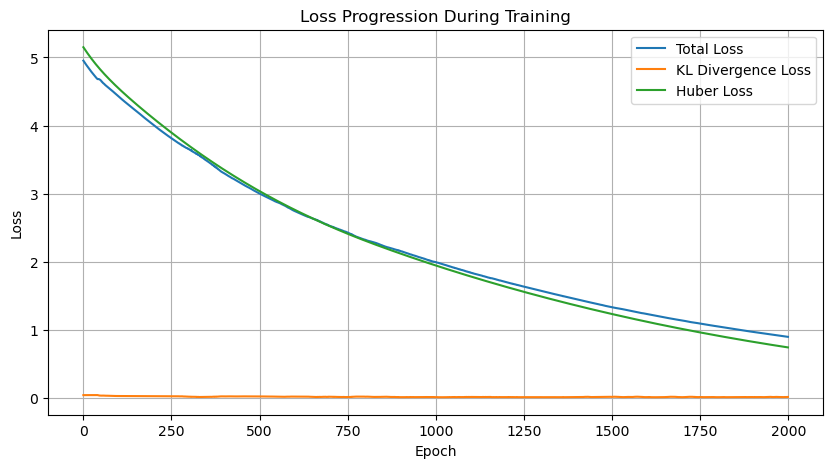

Final refined optimal disp colormap ...


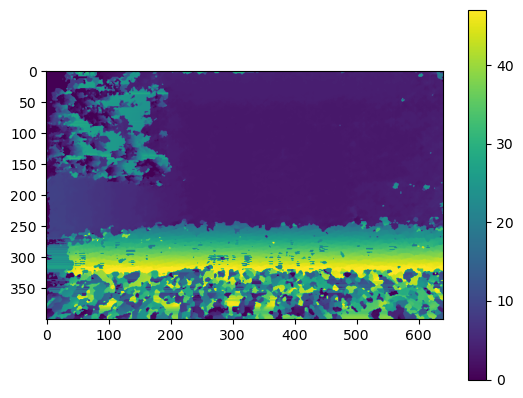

The mean disparity level difference is -0.2483240911392495
Showing difference colormap ...


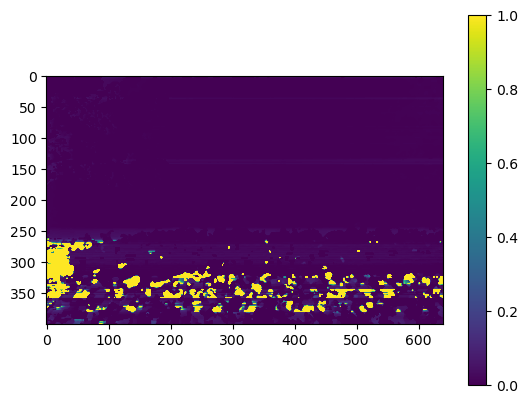

We are processing raw disp for target and vit_b for reference...
Showing vit_b reference colormap ...


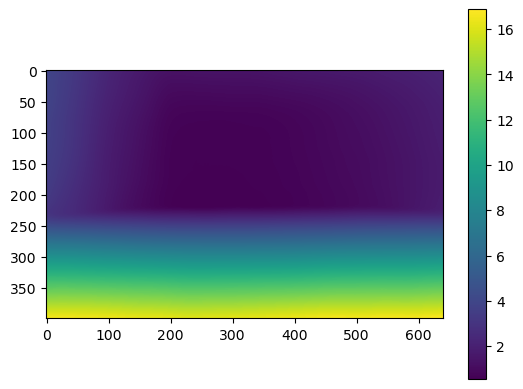

Running on: cuda


100%|██████████| 2000/2000 [00:05<00:00, 385.96it/s]


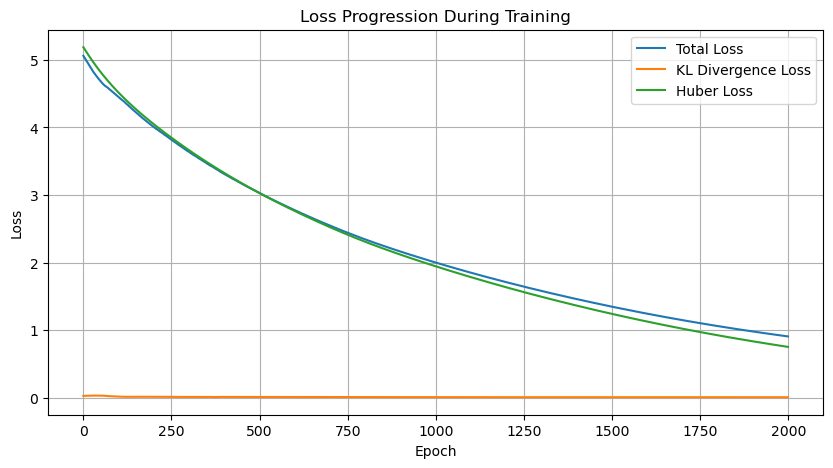

Final refined optimal disp colormap ...


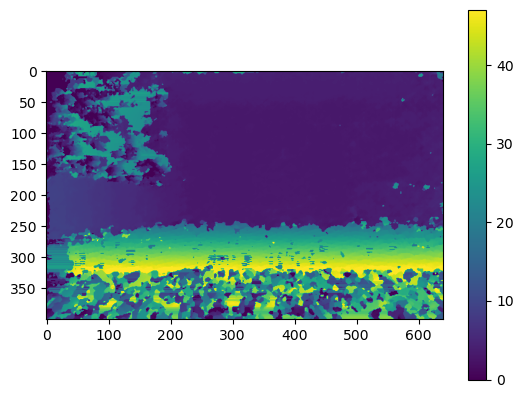

The mean disparity level difference is -0.3056291081481613
Showing difference colormap ...


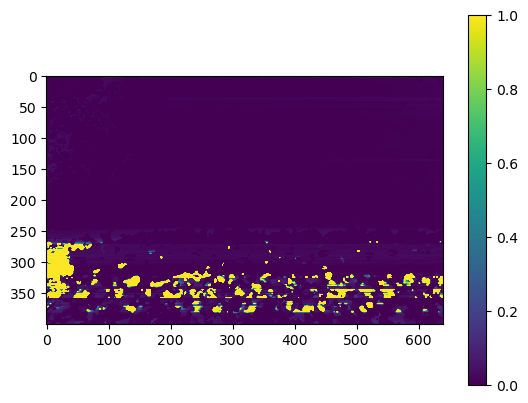

We are processing raw disp for target and vit_l for reference...
Showing vit_l reference colormap ...


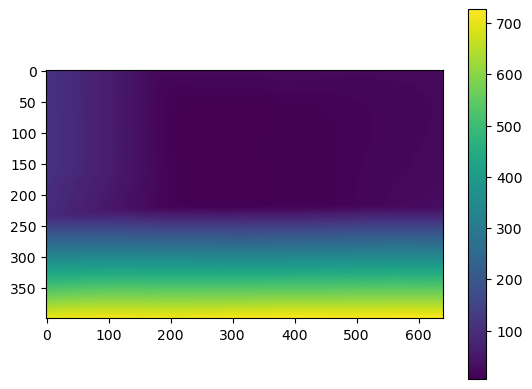

Running on: cuda


100%|██████████| 2000/2000 [00:07<00:00, 277.44it/s]


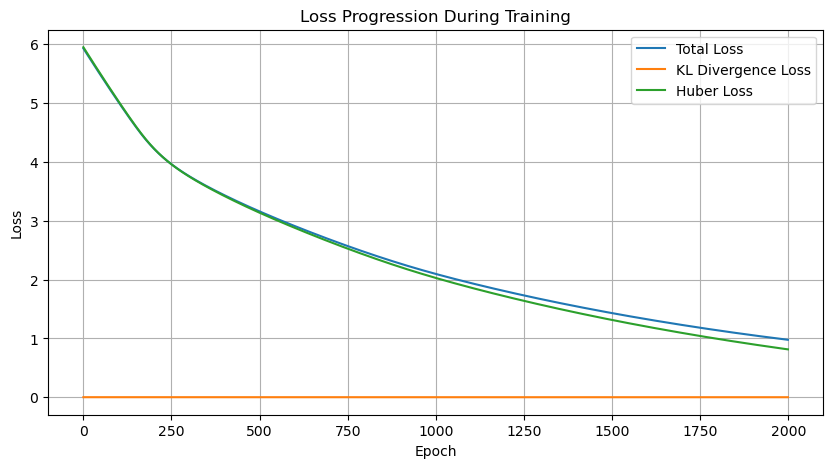

Final refined optimal disp colormap ...


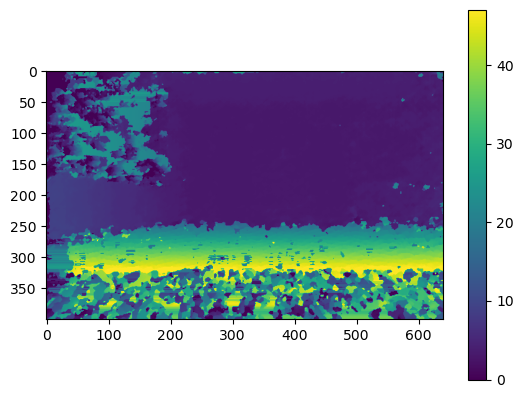

The mean disparity level difference is -0.4325957856825553
Showing difference colormap ...


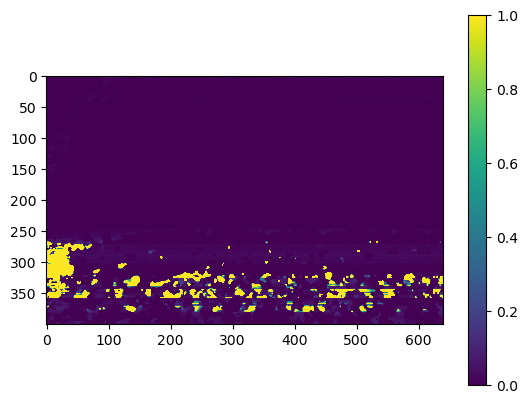

Showing post disp colormap ...


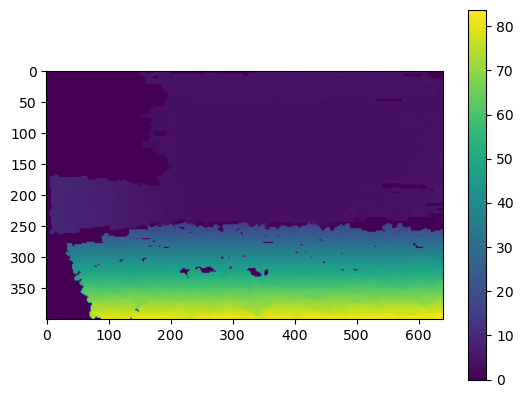

We are processing post disp for target and vit_s for reference...
Showing vit_s reference colormap ...


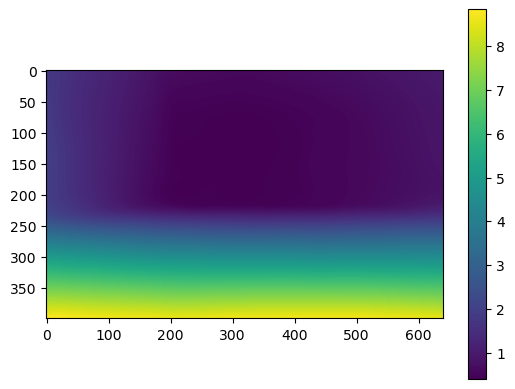

Running on: cuda


100%|██████████| 2000/2000 [00:05<00:00, 396.42it/s]


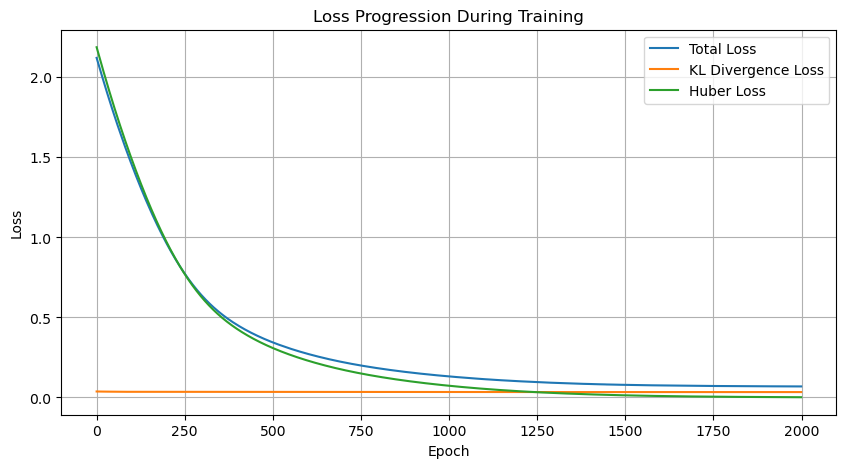

Final refined optimal disp colormap ...


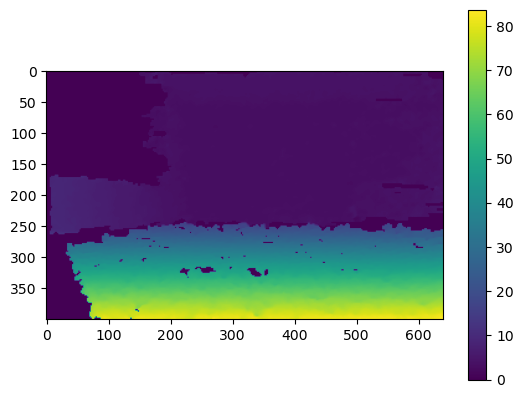

The mean disparity level difference is 0.015094195445999502
Showing difference colormap ...


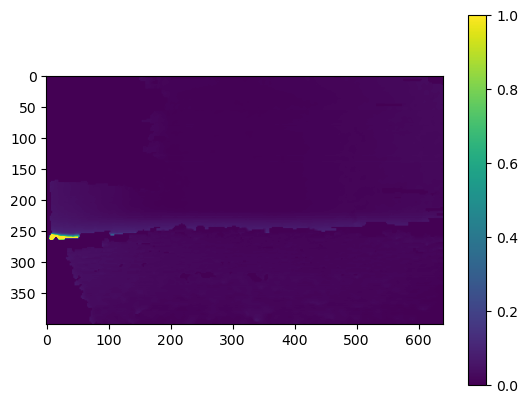

We are processing post disp for target and vit_b for reference...
Showing vit_b reference colormap ...


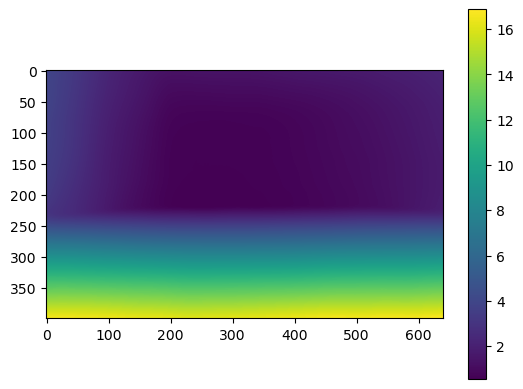

Running on: cuda


100%|██████████| 2000/2000 [00:05<00:00, 383.43it/s]


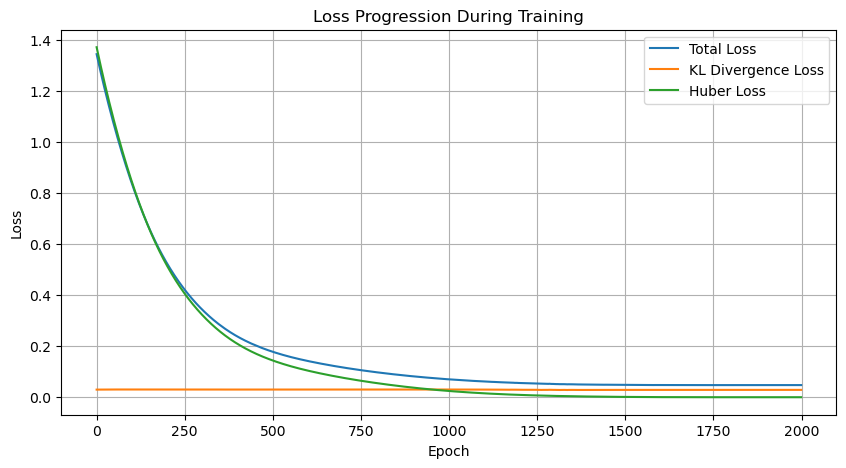

Final refined optimal disp colormap ...


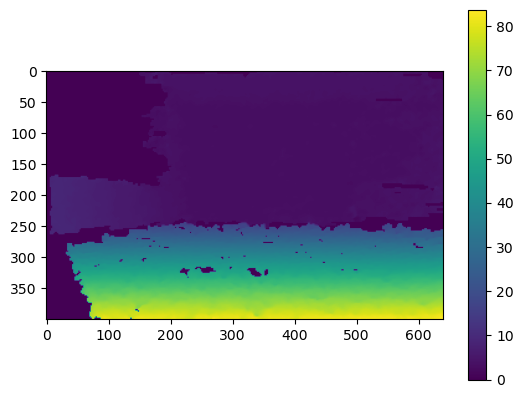

The mean disparity level difference is 0.008663356836885214
Showing difference colormap ...


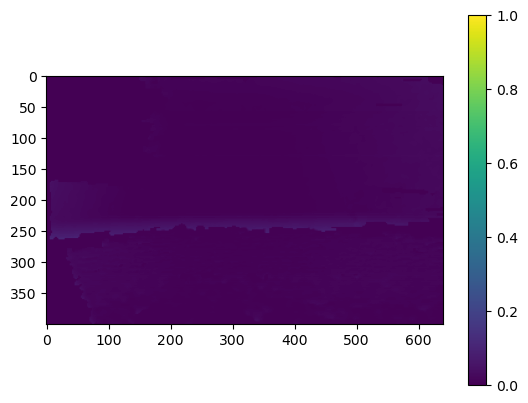

We are processing post disp for target and vit_l for reference...
Showing vit_l reference colormap ...


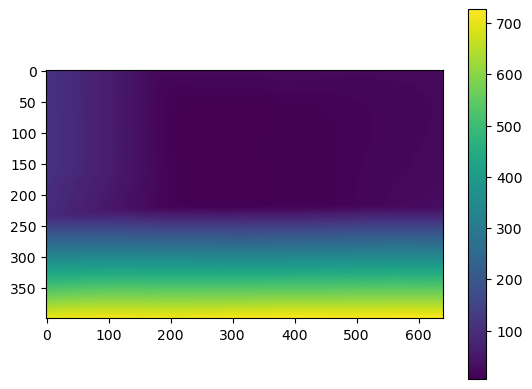

Running on: cuda


100%|██████████| 2000/2000 [00:06<00:00, 299.76it/s]


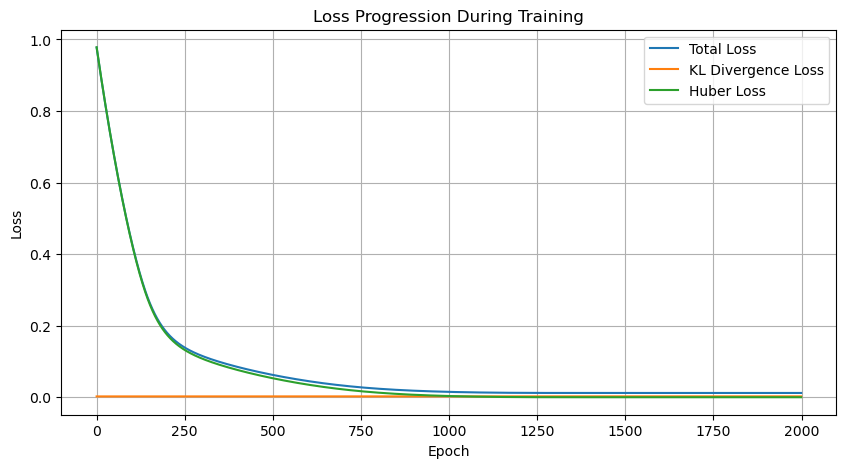

Final refined optimal disp colormap ...


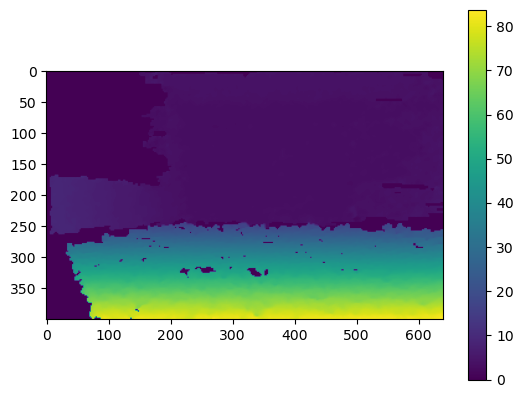

The mean disparity level difference is -0.002737922149244696
Showing difference colormap ...


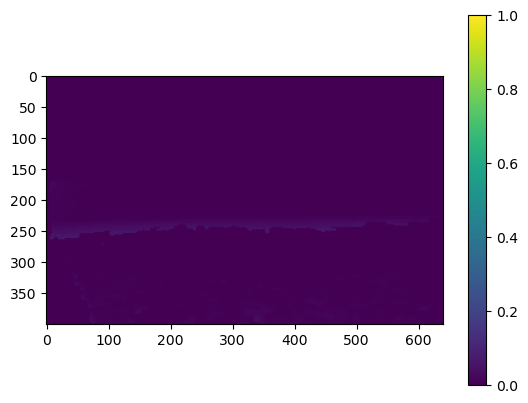

In [27]:
for folder in folders:
    base_dir = os.path.join(top_dir, folder)
    exp_robot = Experiment(base_dir, n_epoches, w_kl, w_hu)
    exp_robot.pipeline()

In [28]:
import gc

gc.collect()

30508